# II. Data Modelisation for Project 4 ML
**(Segment the Customer Base of an e-commerce Website)**

## Contents

1) <a href='#Sec.1'>Clustering of customers</a>
    1) <a href='#Sec.1.1'>k-means clustering</a>
        1) <a href='#Sec.1.1.1'>RFM features</a>
            1) <a href='#Sec.1.1.1.1'>Finding the number of clusters</a>
            1) <a href='#Sec.1.1.1.2'>Analysing customers characteristics of each cluster</a>
            1) <a href='#Sec.1.1.1.3'>Final conclusion</a>
        1) <a href='#Sec.1.1.2'>RFM + review_score features</a>
            1) <a href='#Sec.1.1.2.1'>Finding the number of clusters</a>
            1) <a href='#Sec.1.1.2.2'>Analysing customers characteristics of each cluster</a>
            1) <a href='#Sec.1.1.2.3'>Final conclusion</a>
        1) <a href='#Sec.1.1.3'>RFM + review_score + delivery time features</a>
            1) <a href='#Sec.1.1.3.1'>Finding the number of clusters</a>
            1) <a href='#Sec.1.1.3.2'>Analysing customers characteristics of each cluster</a>
            1) <a href='#Sec.1.1.3.3'>Final conclusion</a>
    1) <a href='#Sec.1.2'>DBScan clustering on RFM + review score features</a>
        1) <a href='#Sec.1.2.1'>Finding the optimal eps and min_samples</a>
        1) <a href='#Sec.1.2.2'>Analysing customers characteristics of each cluster</a>
        1) <a href='#Sec.1.2.3'>Final conclusion</a>
    1) <a href='#Sec.1.3'>Agglomerative Hierarchical Clustering on 25000 customers\
    using RFM + review score features</a>
        1) <a href='#Sec.1.3.1'>Finding the number of clusters</a>
        1) <a href='#Sec.1.3.2'>Analysing customers characteristics of each cluster</a>
        1) <a href='#Sec.1.3.3'>Final conclusion</a>
1) <a href='#Sec.2'>Extracting the dataset with the cluster labels of each customer</a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as st

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import *
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN

from scipy.cluster.hierarchy import dendrogram
from pandas.plotting import parallel_coordinates

from yellowbrick.cluster import SilhouetteVisualizer

import math

import matplotlib.cm as cm
from matplotlib.collections import LineCollection

sns.set()

In [2]:
# To display all columns
pd.set_option('display.max_columns', None)

# Read the dataset
cust_df = pd.read_csv('cust_uniq_df_tsne.csv',
                      sep='\t', low_memory=False)
print('The size of the table is', cust_df.shape[0],
      'rows, and', cust_df.shape[1], 'columns.')

# Read the dataset
cust_df_norm = pd.read_csv('cust_uniq_df_norm_tsne.csv',
                           sep='\t', low_memory=False)

The size of the table is 92506 rows, and 12 columns.


## <font id='Sec.1'> 1. Clustering of customers

In [3]:
cust_df.describe()

,nbr_orders,time_since_last_order_h,review_score,delivery_time_h,payment_value,Dim_1_RFM_tsne,Dim_2_RFM_tsne,Dim_1_RFM_RS_tsne,Dim_2_RFM_RS_tsne,Dim_1_RFM_RS_DT_tsne,Dim_2_RFM_RS_DT_tsne
count,92506.000000,92506.000000,92506.000000,92506.000000,92506.000000,92506.000000,92506.000000,92506.000000,92506.000000,92506.000000,92506.000000
mean,1.033111,6879.183058,4.143256,300.446736,147.325936,-0.165195,0.241055,0.692512,-0.610111,-0.003926,-0.275092
std,0.201706,3661.637367,1.288281,228.476401,147.654031,68.681386,60.676779,65.990185,63.227708,60.935956,58.874735
min,1.000000,1178.000000,1.000000,12.000000,9.590000,-150.689100,-129.645870,-145.925300,-132.357850,-128.223130,-125.142070
25%,1.000000,3914.000000,4.000000,162.000000,62.010000,-54.580124,-46.142888,-50.868428,-50.248683,-48.717608,-46.105664
50%,1.000000,6426.000000,5.000000,245.000000,104.720000,-0.070813,-0.603778,1.157957,0.431901,-1.889924,1.126859
75%,1.000000,9481.000000,5.000000,375.000000,173.840000,52.628414,47.424030,52.362757,49.077914,46.209740,45.881613
max,7.000000,17856.000000,5.000000,5031.000000,1319.320000,145.105960,120.249740,127.797980,134.975880,128.720800,130.714310


In [4]:
palette = sns.color_palette('bright', 10)


def plot_dendrogram(model, **kwargs):
    '''Create linkage matrix and then plot the dendrogram'''

    # Create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


def addAlpha(colour, alpha):
    '''Add an alpha to the RGB colour'''

    return (colour[0], colour[1], colour[2], alpha)


def display_parallel_coordinates(df, num_clusters, cluster_col):
    '''Display a parallel coordinates plot for the clusters in df'''

    # Select data points for individual clusters
    cluster_points = []
    for i in range(num_clusters):
        cluster_points.append(df[df[cluster] == i])

    # Create the plot
    fig = plt.figure(figsize=(12, 3*num_clusters))
    title = fig.suptitle('Parallel Coordinates Plot for the Clusters',
                         fontsize=18)
    fig.subplots_adjust(top=0.95, wspace=0)

    # Display one plot for each cluster
    for i in range(num_clusters):
        plt.subplot(num_clusters, 1, i+1)
        for j, c in enumerate(cluster_points):
            if i != j:
                pc = parallel_coordinates(c, cluster,
                                          color=[addAlpha(palette[j], 0.2)])
        pc = parallel_coordinates(cluster_points[i], cluster,
                                  color=[addAlpha(palette[i], 0.5)])

        # Stagger the axes
        ax = plt.gca()
        plt.xticks(ha='right', rotation=30, rotation_mode='anchor')


def display_parallel_coordinates_centroids(df, num_clusters, cluster_col):
    '''Display a parallel coordinates plot for the centroids in df'''

    # Create the plot
    fig = plt.figure(figsize=(10, 2.5))
    title = fig.suptitle('Parallel Coordinates plot for the Centroids',
                         fontsize=15)
    fig.subplots_adjust(top=0.9, wspace=0)

    # Draw the chart
    parallel_coordinates(df, cluster_col, color=palette)

    # Stagger the axes
    ax = plt.gca()
    plt.xticks(ha='right', rotation=20, rotation_mode='anchor')

In [5]:
def silhouette_plot(cluster_labels, n_clusters, silh_avg, sample_silh_values):

    fig = plt.figure(figsize=(8, 4))
    ax = fig.add_subplot(1, 1, 1)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silh_values = sample_silh_values[cluster_labels == i]

        ith_cluster_silh_values.sort()

        size_cluster_i = ith_cluster_silh_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                         0,
                         ith_cluster_silh_values,
                         facecolor=color,
                         edgecolor=color,
                         alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax.text(-0.05, y_lower+0.5*size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax.set_title('The silhouette plot for various clusters')
    ax.set_xlabel('The silhouette coefficient values')
    ax.set_ylabel('Cluster label')

    # The vertical line for average silhouette score of all the values
    ax.axvline(x=silh_avg, color='red', linestyle='--')

    ax.set_yticks([])  # Clear the yaxis labels / ticks

    plt.suptitle('Silhouette analysis with n_clusters = {}'
                 .format(n_clusters), fontsize=14, fontweight='bold')
    plt.show()

### <font id='Sec.1.1'> A. k-means clustering

In [6]:
# Function that test a range of number of clusters using k-means
# and display silhouette analysis
# and 2D projection of the clusters on the two t-SNE dimensions
def n_clusters_test_k_means(df, columns_list, range_n_clusters,
                            tsne_D1_col, tsne_D2_col):
    output = []
    # Loop on the n_clusters
    for n_clusters in range_n_clusters:
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(15, 6)

        # The 1st subplot is the silhouette plot
        # The silhouette coeff can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(df[columns_list])+(n_clusters+1)*10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters, init='k-means++', n_init=10)
        clusterer.fit(df[columns_list])
        cluster_labels = clusterer.fit_predict(df[columns_list])
        inertia = clusterer.inertia_

        # Davies Bouldin Score
        davies_bouldin = davies_bouldin_score(df[columns_list], cluster_labels)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the
        # formed clusters
        silhouette_avg = silhouette_score(df[columns_list], cluster_labels)

        output.append((n_clusters, inertia, silhouette_avg, davies_bouldin))

        # Compute the silhouette scores for each sample
        sample_silh_values = silhouette_samples(df[columns_list],
                                                cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silh_values = sample_silh_values[cluster_labels == i]

            ith_cluster_silh_values.sort()

            size_cluster_i = ith_cluster_silh_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0,
                              ith_cluster_silh_values,
                              facecolor=color,
                              edgecolor=color,
                              alpha=0.7)

            # Label the silhouette plots with their cluster # at the middle
            ax1.text(-0.05, y_lower+0.5*size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title('The silhouette plot for the various clusters.')
        ax1.set_xlabel('The silhouette coefficient values')
        ax1.set_ylabel('Cluster label')

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color='red', linestyle='--')

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(df[tsne_D1_col], df[tsne_D2_col], marker='.', s=30,
                    lw=0, alpha=0.7, c=colors, edgecolor='k')

        # Labeling the clusters
        centers = clusterer.cluster_centers_
        # Draw white circles at cluster centers
        ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                    c='white', alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker='$%d$' % i,
                        alpha=1, s=50, edgecolor='k')

        ax2.set_title('The visualization of the clustered data.')
        ax2.set_xlabel('TSNE space for the 1st dimension')
        ax2.set_ylabel('TSNE space for the 2nd dimension')

        plt.suptitle('Silhouette analysis for KMeans with n_clusters = %d'
                     % n_clusters, fontsize=14, fontweight='bold')
    plt.show()

    output = pd.DataFrame(output, columns=['n_clusters', 'inertia',
                                           'silhouette_score',
                                           'davies_bouldin_score'])
    return (output)

#### <font id='Sec.1.1.1'> a) RFM features

##### <font id='Sec.1.1.1.1'> i) Finding the number of clusters

In [7]:
col_list = ['nbr_orders', 'time_since_last_order_h', 'payment_value']

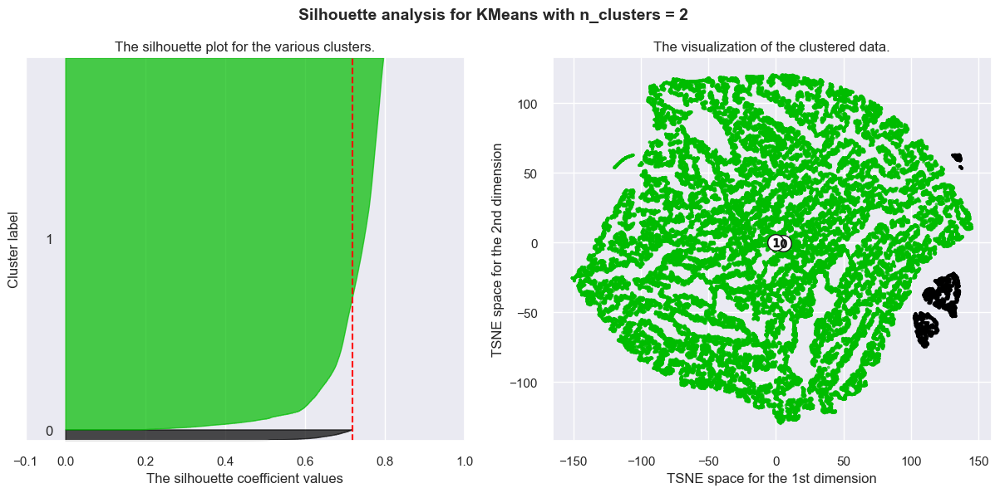

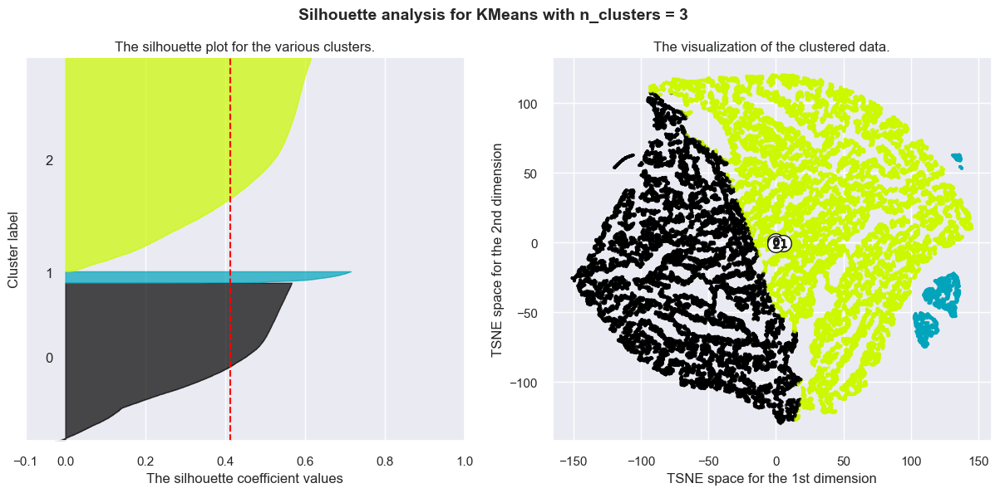

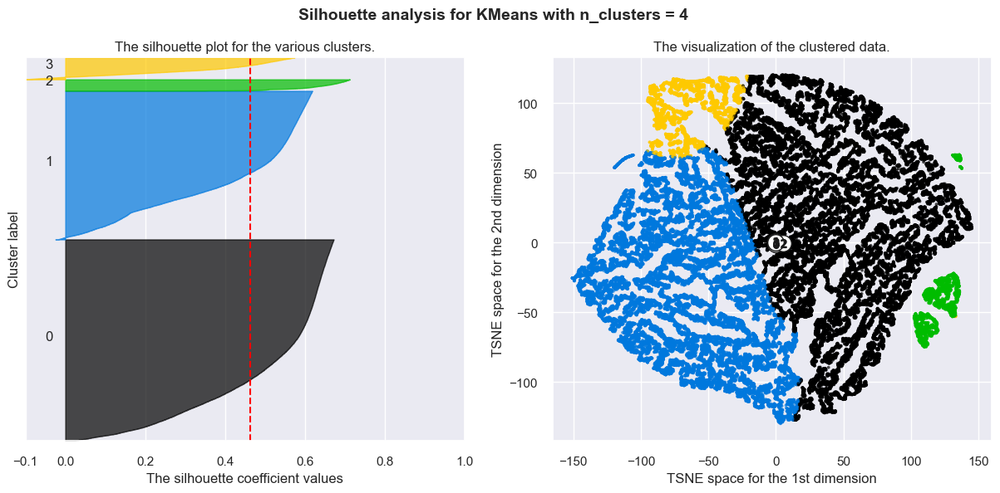

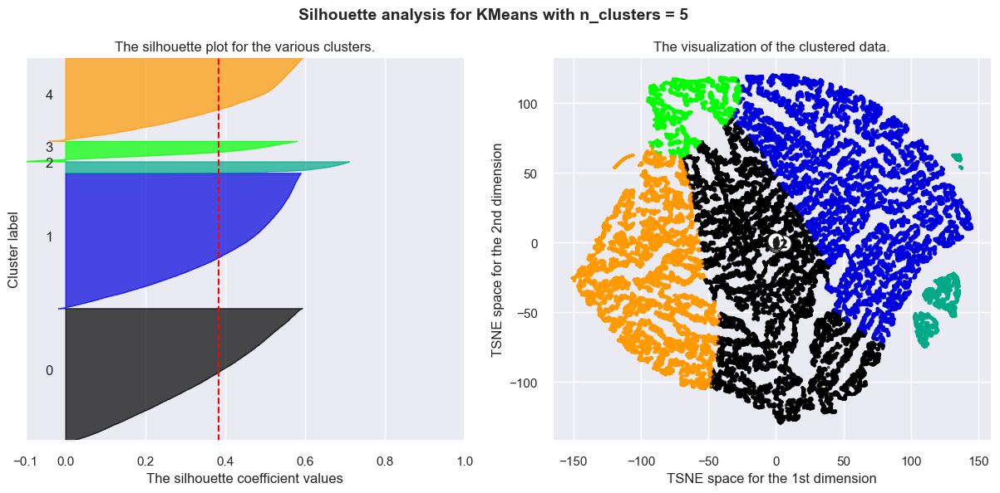

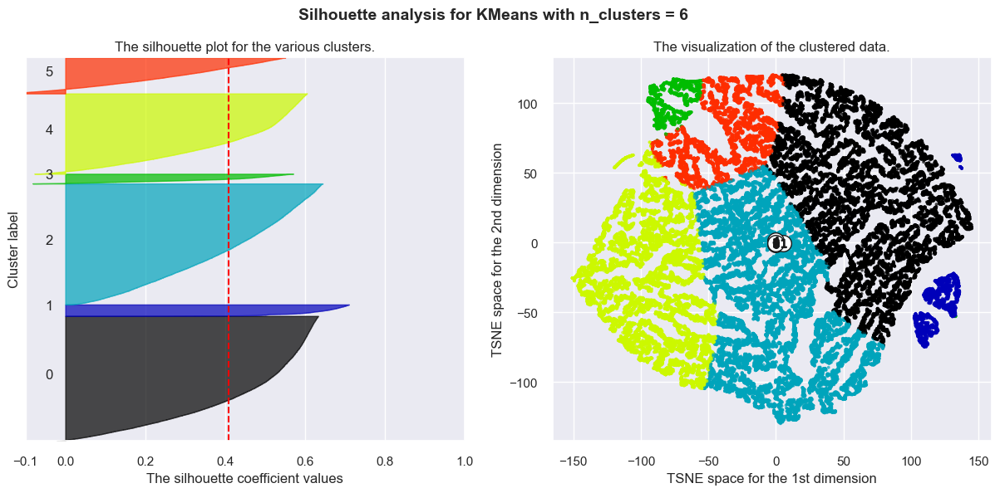

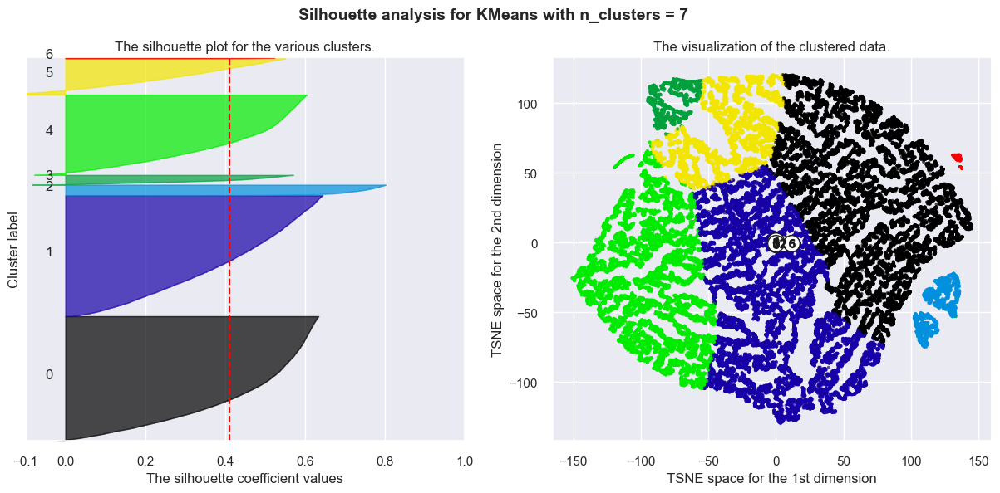

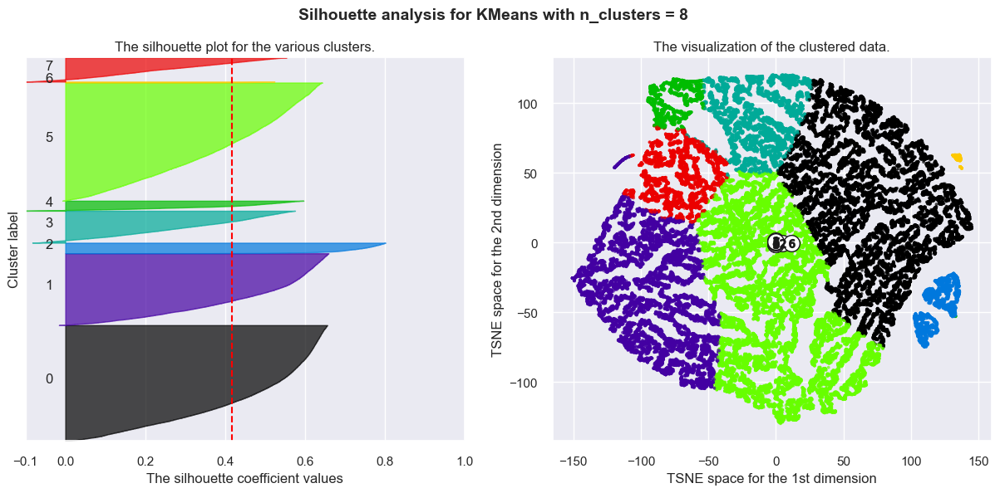

In [8]:
# Number of clusters range to test for k-means
range_n_clusters = np.arange(2, 9, 1)

# Initialisation of a df that will help in the selection of the n_clusters
output = []

# Realize the test
output = n_clusters_test_k_means(cust_df_norm, col_list, range_n_clusters,
                                 'Dim_1_RFM_tsne', 'Dim_2_RFM_tsne')

Observations:
- We see, for all n_clusters, that the silhouette average (red dashed line) is below all clusters
- We see that n_clusters = 2 give the highest silhouette score followed by n_clusters = 4
- For n_clusters = 2, most of the customers are grouped into cluster # 1 which is not optimal
- For n_clusters = 4, we see that most of customers are captured by clusters # 0 and 1\
while clusters # 2 and 3 are much smaller.

We will check the elbow curve, silhouette and Davies Bouldin score to choose the final n_clusters

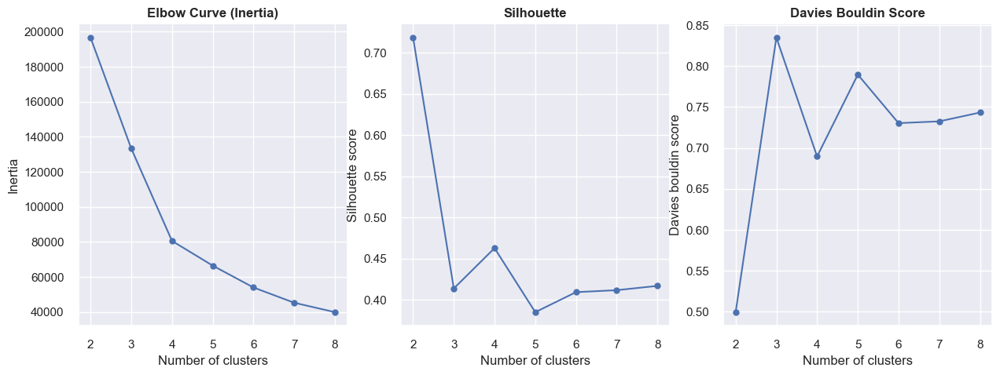

In [9]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].plot(output['n_clusters'], output['inertia'], marker='o')
axes[0].set_title('Elbow Curve (Inertia)', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Inertia')
axes[0].set_xlabel('Number of clusters')
axes[1].plot(output['n_clusters'], output['silhouette_score'], marker='o')
axes[1].set_title('Silhouette', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Silhouette score')
axes[1].set_xlabel('Number of clusters')
axes[2].plot(output['n_clusters'], output['davies_bouldin_score'], marker='o')
axes[2].set_title('Davies Bouldin Score', fontsize=12, fontweight='bold')
axes[2].set_ylabel('Davies bouldin score')
axes[2].set_xlabel('Number of clusters')
plt.show()

It seems that n_clusters = 4 is the optimal according to the elbow method, silhouette score,\
and Davies Bouldin score.

##### <font id='Sec.1.1.1.2'> ii) Analysing customers characteristics of each cluster

In [10]:
n_clusters = 4

clusterer = KMeans(n_clusters=n_clusters,
                   init='k-means++',
                   n_init=10).fit(cust_df_norm[col_list])
cluster_labels = clusterer.labels_

# The silhouette_score gives the average value for all the samples.
silh_avg = silhouette_score(cust_df_norm[col_list], cluster_labels)

print('Inertia value: {}, silhouette score: {}, and davies bouldin score: {}.'
      .format(clusterer.inertia_,
              silh_avg,
              davies_bouldin_score(cust_df_norm[col_list], cluster_labels)))

Inertia value: 80596.75887481938, silhouette score: 0.4627520690182303, and davies bouldin score: 0.6901555677204506.


K-means_labels_RFM_tsne
0    35826
1    48571
2     2765
3     5344
dtype: int64


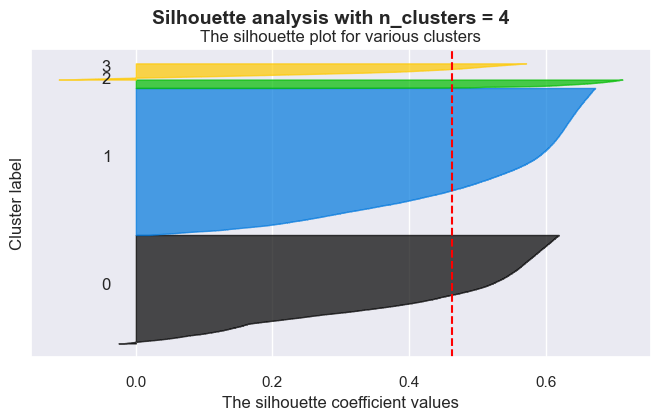

In [11]:
cust_df_norm['K-means_labels_RFM_tsne'] = cluster_labels
cust_df['K-means_labels_RFM_tsne'] = cluster_labels
print(cust_df_norm.groupby('K-means_labels_RFM_tsne').size())

# Compute the silhouette scores for each sample
sample_silh_values = silhouette_samples(cust_df_norm[col_list], cluster_labels)

silhouette_plot(cluster_labels, n_clusters, silh_avg, sample_silh_values)

As observed in the silhouette analysis, most of the customers are captured by clusters # 0 and 1\
while clusters numbers # 2 and 3 represent 8.6% of the customers.\
Next, we will check what those clusters represent in terms of customer characteristics.

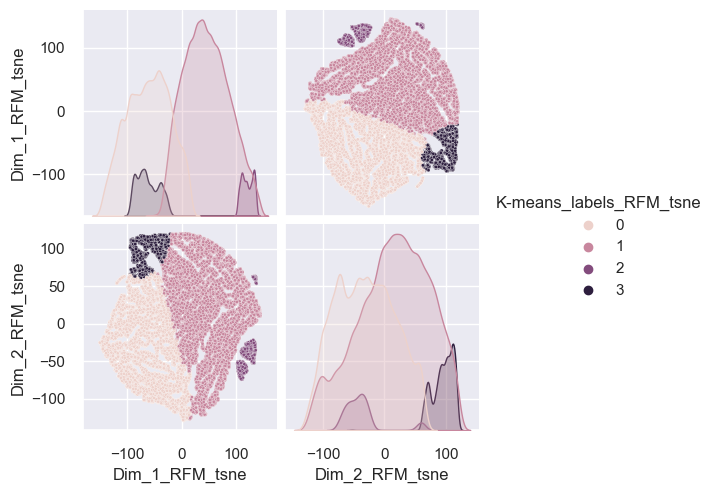

In [12]:
sns.pairplot(cust_df[['Dim_1_RFM_tsne',
                      'Dim_2_RFM_tsne',
                      'K-means_labels_RFM_tsne']],
             hue='K-means_labels_RFM_tsne', plot_kws={'s': 5})

Dimension reduction done on the data using t-SNE method is used here to better visualize the clusters.

Observations:
- Cluster # 0 occupy the region where t-SNE dimension 1 and 2 are low\
(customers that made purchase long time ago)\
- Cluster # 1 occupy the region where t-SNE dimension 1 and 2 are high\
(customers that made purchase recently).
- Cluster # 2 occupy a region where t-SNE dimension 1 is high and t-SNE dimension 2 is low\
(customers that made multiple orders).
- Cluster # 3 occupy a region where t-SNE dimension 1 is low and t-SNE dimension 2 is high\
(customers that made high payment value purchase).

Lets now analyse feature per feature to confirm those observations.

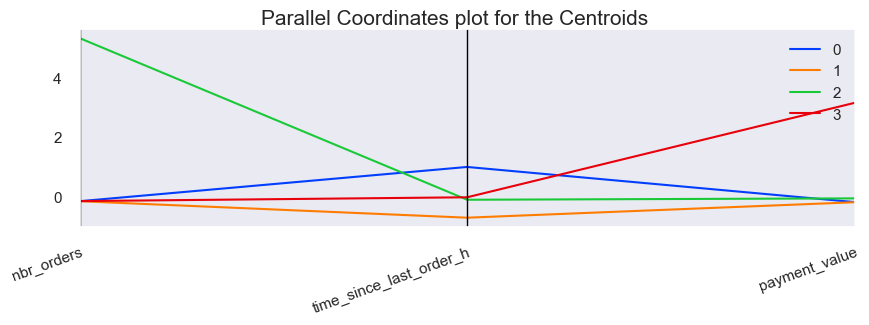

In [13]:
col_list = ['nbr_orders', 'time_since_last_order_h', 'payment_value']
# Create a data frame containing our centroids
centroids = cust_df_norm.groupby('K-means_labels_RFM_tsne')[col_list].mean()
centroids = pd.DataFrame(centroids, columns=col_list)
centroids['cluster_labels'] = centroids.index

display_parallel_coordinates_centroids(centroids, 4, 'cluster_labels')

Observations:
- Cluster # 0 represents customers who made a purchase long time ago.
- Cluster # 1 represents customers who made a purchase recently.
- Cluster # 2 represents customers who made multiple orders.
- Cluster # 3 represents customers who made high payment value purchase.

Those classifications reconfirm the t-SNE analysis done before.

For better visulalisation of the customer caracteritics in each cluster, we used radar plots.

In [14]:
# Function that do radar plot of the features for each cluster
def radar_plot_for_each_cluster(df, col_list, nbColumns):
    nbRows = df[col_list].iloc[:, -1].nunique()//nbColumns +\
             (df[col_list].iloc[:, -1].nunique() % nbColumns > 0)
    colClusters = df[col_list].columns[-1]

    plt.figure(figsize=(18, 5*nbRows))

    for i in sorted(df[col_list].iloc[:, -1].unique()):
        # number of variable
        categories = list(df[col_list])[:-1]
        N = len(categories)

        # We are going to plot the first line of the data frame.
        # But we need to repeat the first value to close the circular graph:
        values = df[col_list][df[col_list][colClusters] == i]\
            .drop(colClusters, axis=1).mean().values.tolist()
        values += values[:1]

        # What will be the angle of each axis in the plot?
        # (we divide the plot / number of variable)
        angles = [n / float(N) * 2 * 3.14 for n in range(N)]
        angles += angles[:1]

        # Initialise the spider plot
        ax = plt.subplot(nbRows, nbColumns, i+1, polar=True)

        # Draw ylabels
        ax.set_theta_offset(3.14/7)
        ax.set_rlabel_position(0)
        plt.yticks([-5, -2.5, 0, 2.5, 5], ['-5', '-2.5', '0', '2.5', '5'],
                   color='grey',
                   size=8)
        plt.ylim(-5, 5)

        # Draw one axe per variable + add labels labels yet
        plt.xticks(angles[:-1],
                   categories,
                   color='grey',
                   size=10,
                   ha='left',
                   fontweight='bold')

        # Plot data
        ax.plot(angles,
                values,
                linewidth=1.5,
                linestyle='solid')

        # Fill area
        ax.fill(angles,
                values,
                'b',
                alpha=0.2)

        plt.title(f'Cluster n°{i}')

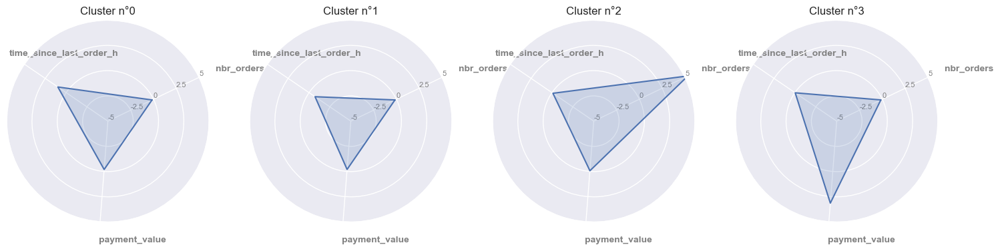

In [15]:
col_list = ['nbr_orders', 'time_since_last_order_h', 'payment_value']\
           + ['K-means_labels_RFM_tsne']

radar_plot_for_each_cluster(cust_df_norm, col_list, 4)

Radar plots reconfirm the assignement of customers in each cluster.

We can go deeper and analyse the distributions of each feature in each cluster using barplot.

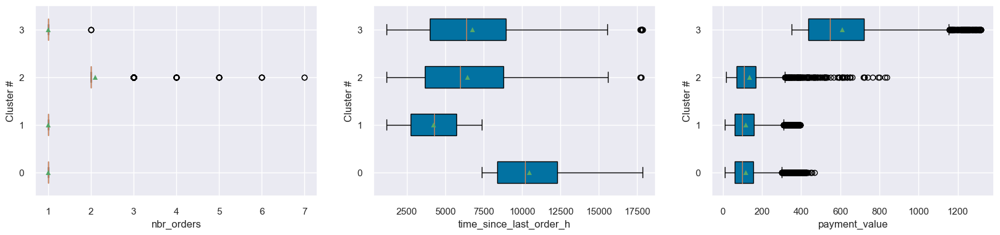

In [16]:
col_list = ['nbr_orders', 'time_since_last_order_h', 'payment_value']
cat_column = 'K-means_labels_RFM_tsne'

n_col = len(col_list)
fig, axes = plt.subplots(1, n_col, figsize=(20, 4))
axes = np.array(axes)
i = 0
cat_list = cust_df.groupby(by=cat_column).nunique()\
                  .sort_values(cat_column, ascending=True).head(10).index
for ax in axes.reshape(-1):
    groupes = []
    for m in cat_list:
        groupes.append(cust_df[cust_df[cat_column] == m][col_list[i]])
    ax.boxplot(groupes, labels=cat_list, vert=False,
               patch_artist=True, showmeans=True)
    ax.set_xlabel(format(col_list[i]))
    ax.set_ylabel(format('Cluster #'))
    i += 1
plt.show()

Adding to the observations done before:
- Cluster # 2 that represents customers who made multiple purchase\
also has some customers that made high payment value purchase.
- Cluster # 3 that represents customers who made high payment value purchase\
also has few customers that made multiple orders.

Now we can check if there any correlation between features cluster by cluster.

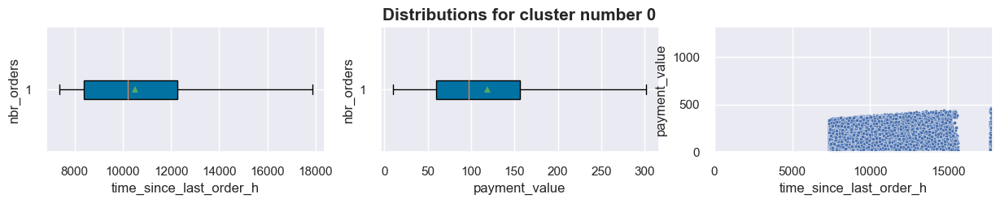

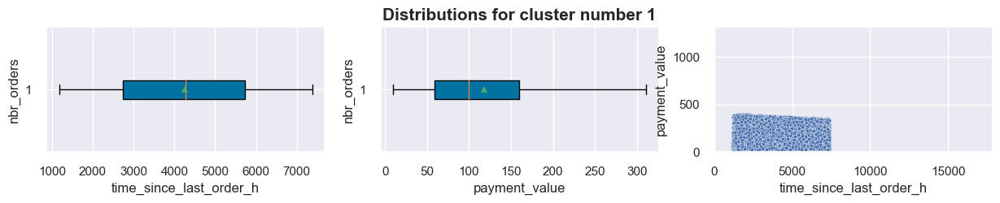

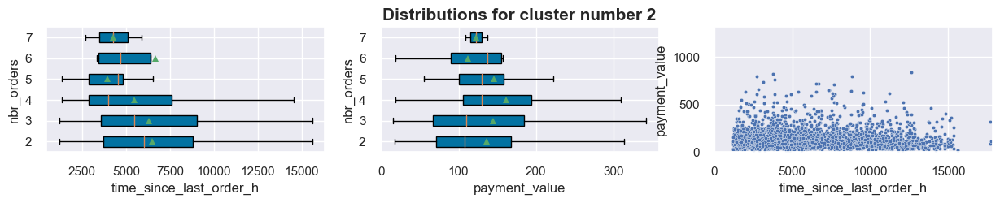

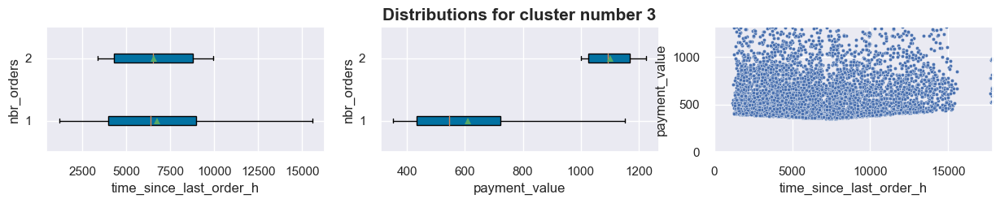

In [17]:
cat_column = 'nbr_orders'

for cluster_num in cust_df['K-means_labels_RFM_tsne'].sort_values().unique():
    X = cust_df[cust_df['K-means_labels_RFM_tsne'] == cluster_num]

    fig, axes = plt.subplots(1, 3, figsize=(15, 2))

    i = 0
    for column in ['time_since_last_order_h', 'payment_value']:
        cat_list = X.groupby(by=cat_column).nunique()\
                    .sort_values(cat_column, ascending=True).head(10).index
        groupes = []
        for m in cat_list:
            groupes.append(X[X[cat_column] == m][column])
        axes[i].boxplot(groupes, labels=cat_list, showfliers=False,
                        vert=False, patch_artist=True, showmeans=True)
        axes[i].set_xlabel(format(column))
        axes[i].set_ylabel(format(cat_column))
        i += 1
    axes[1].set_title('Distributions for cluster number {}'
                      .format(cluster_num), fontsize=15, fontweight='bold')

    sns.scatterplot(data=X,
                    x='time_since_last_order_h',
                    y='payment_value',
                    s=10,
                    ax=axes[2])
    axes[2].set_xlim(0, cust_df['time_since_last_order_h'].max())
    axes[2].set_ylim(0, cust_df['payment_value'].max())
    plt.show()

No much correlation between the features.

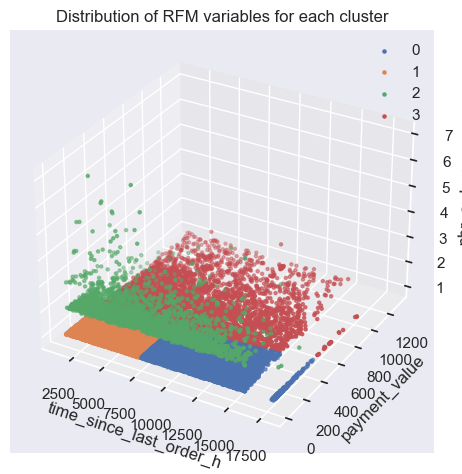

In [18]:
ax = plt.figure().add_subplot(projection='3d')

for cluster in cust_df['K-means_labels_RFM_tsne'].sort_values().unique():
    X = cust_df[cust_df['K-means_labels_RFM_tsne'] == cluster]
    ax.scatter(X['time_since_last_order_h'],
               X['payment_value'],
               X['nbr_orders'],
               marker='o',
               label=cluster,
               s=5)
ax.set_xlabel('time_since_last_order_h')
ax.set_ylabel('payment_value')
ax.set_zlabel('nbr_orders')
ax.set_title('Distribution of RFM variables for each cluster')
plt.legend()
plt.show()

##### <font id='Sec.1.1.1.3'> iii) Final conclusion
    
We detected that:
- Cluster # 0 represents customers who made a purchase long time ago.\
    They represent 38.8% of all customers.
- Cluster # 1 represents customers who made a purchase recently.\
    They represent 52.4% of all customers.
- Cluster # 2 represents customers who made multiple orders.\
    They represent 3% of all customers.
- Cluster # 3 represents customers who made high payment value purchase.\
    They represent 5.8% of all customers.

However we don't know for example why cluster # 0 didn't made another purchase,\
for exemple where they happy with their purchase?\
For that we will use next the review score in order to better characterize the clusters.

#### <font id='Sec.1.1.2'> b) RFM + review_score features

##### <font id='Sec.1.1.2.1'> i) Finding the number of clusters

In [19]:
col_list = ['nbr_orders', 'time_since_last_order_h',
            'payment_value', 'review_score']

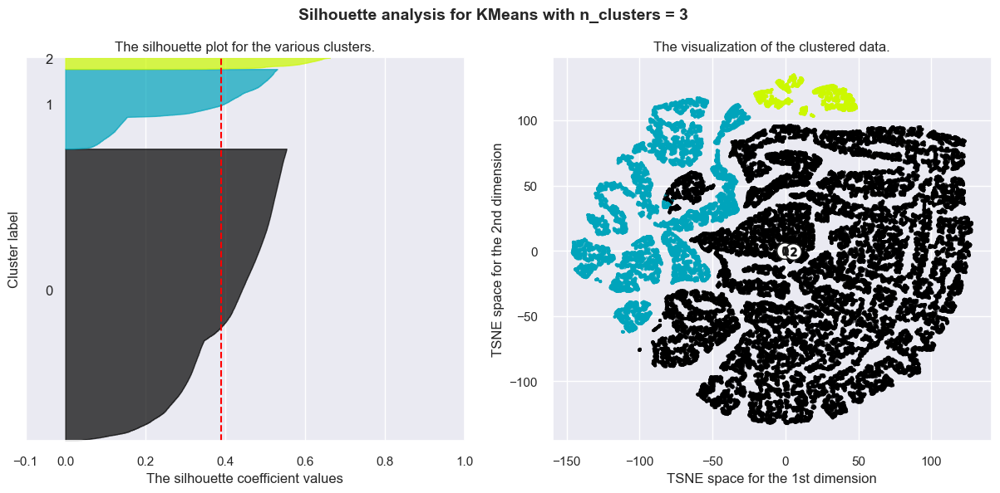

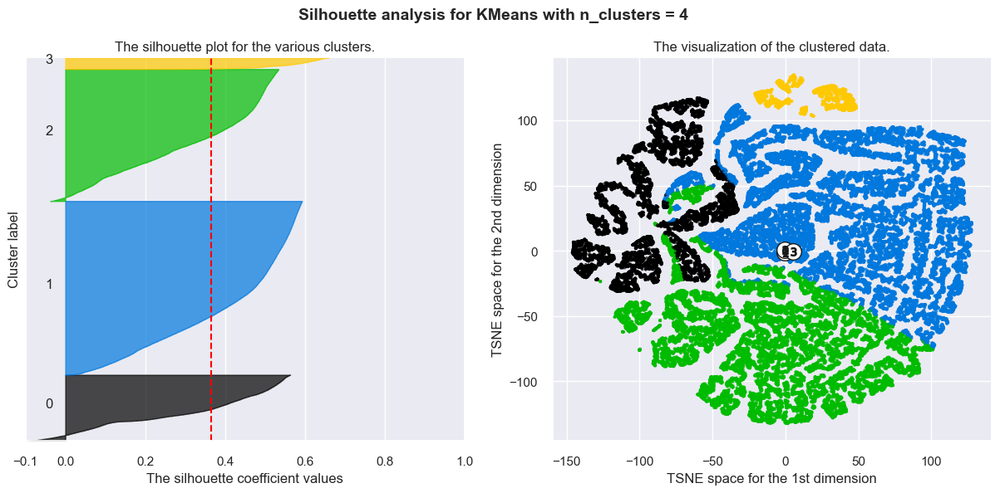

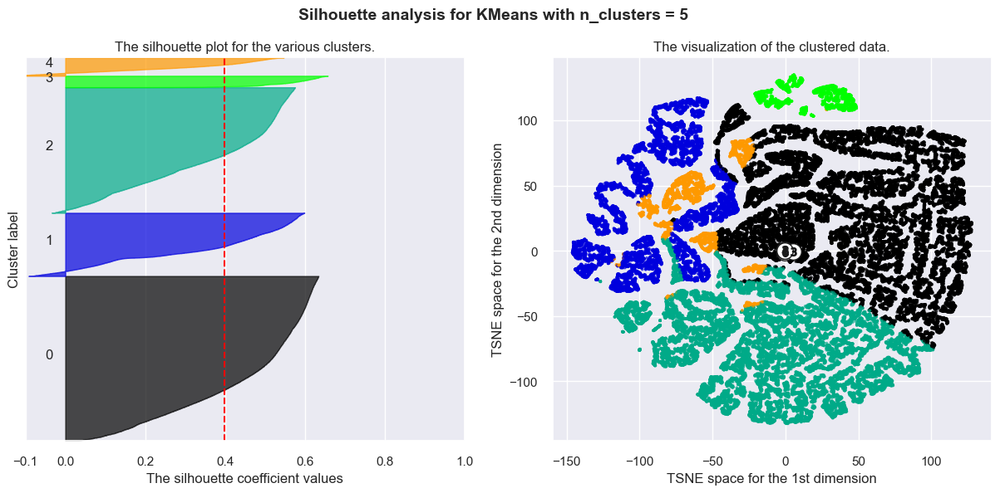

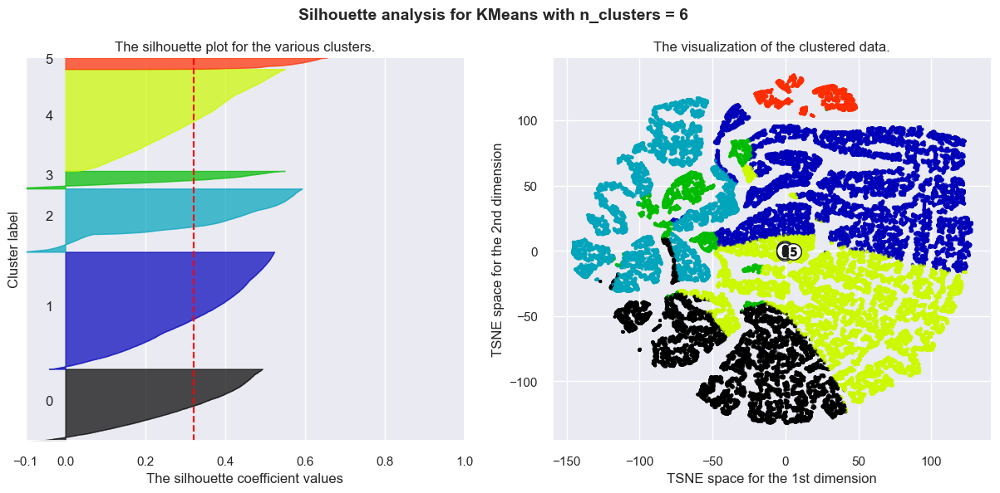

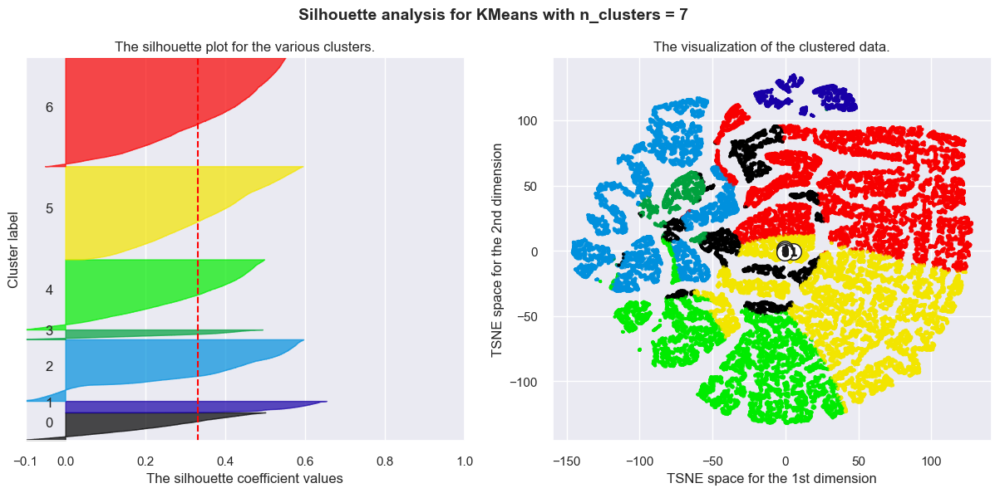

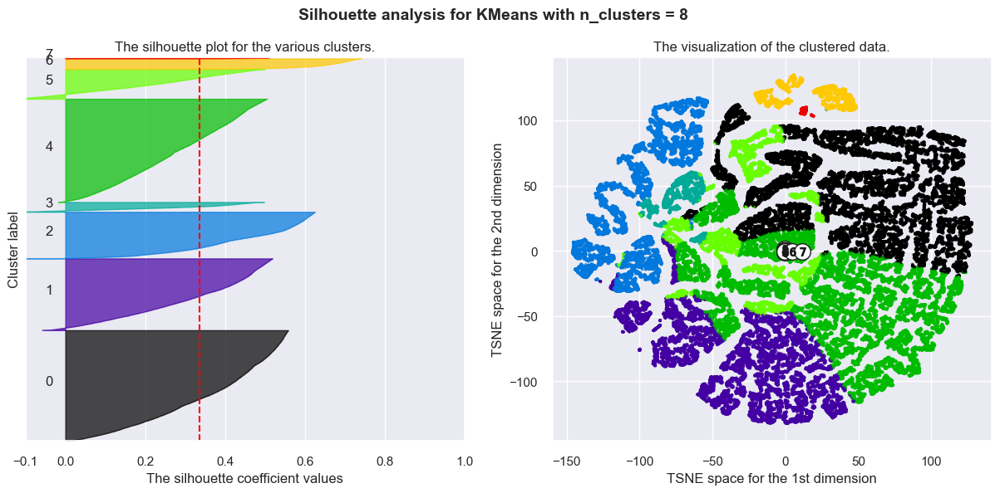

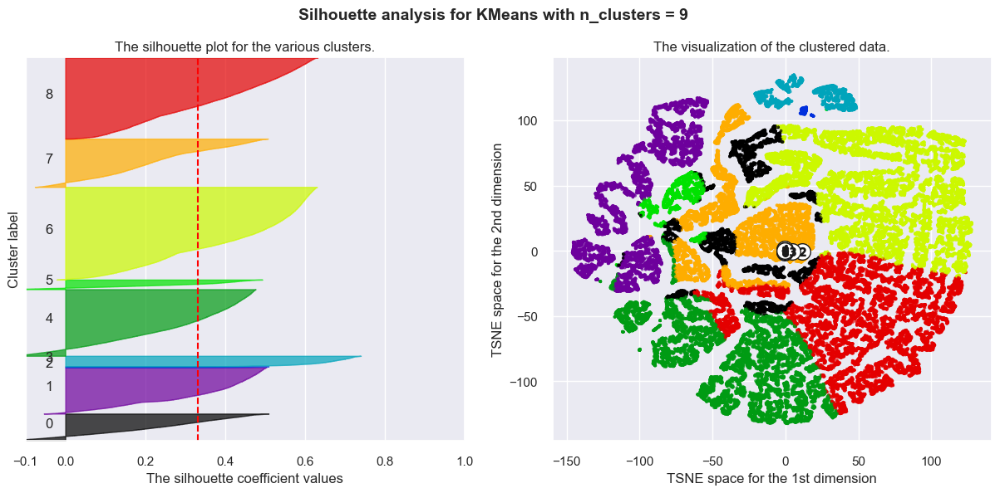

In [20]:
# Number of clusters range to test for k-means
range_n_clusters = np.arange(3, 10, 1)

# Initialisation of a df that will help in the selection of the n_clusters
output = []

# Realize the test
output = n_clusters_test_k_means(cust_df_norm, col_list, range_n_clusters,
                                 'Dim_1_RFM_RS_tsne', 'Dim_2_RFM_RS_tsne')

Observations:
- We see, for all n_clusters, that the silhouette average (red dashed line) is below all clusters
- We see that n_clusters = 5 give the highest silhouette score followed by n_clusters = 3
- For n_clusters = 5, we see that most of customers are captured by clusters # 0, 1, and 2\
while clusters # 3 and 4 are much smaller.

We will check the elbow curve, silhouette and Davies Bouldin score to choose the final n_clusters

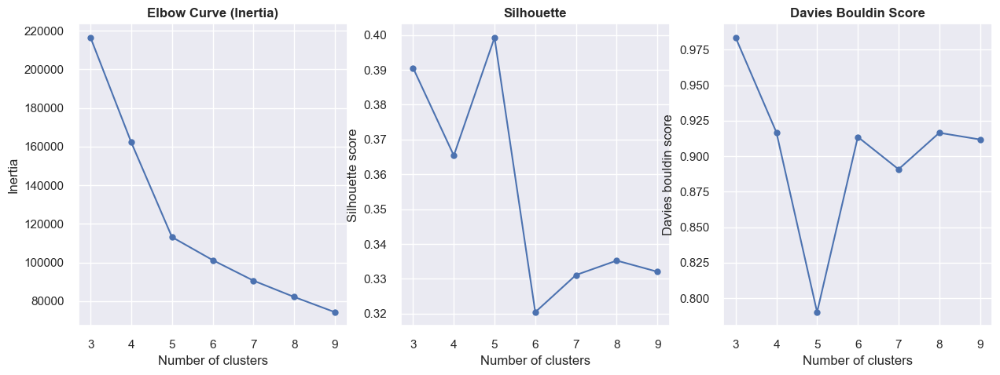

In [21]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].plot(output['n_clusters'], output['inertia'], marker='o')
axes[0].set_title('Elbow Curve (Inertia)', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Inertia')
axes[0].set_xlabel('Number of clusters')
axes[1].plot(output['n_clusters'], output['silhouette_score'], marker='o')
axes[1].set_title('Silhouette', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Silhouette score')
axes[1].set_xlabel('Number of clusters')
axes[2].plot(output['n_clusters'], output['davies_bouldin_score'], marker='o')
axes[2].set_title('Davies Bouldin Score', fontsize=12, fontweight='bold')
axes[2].set_ylabel('Davies bouldin score')
axes[2].set_xlabel('Number of clusters')
plt.show()

5 clusters seems optimal using the elbow curve, silhouette, and Davies-Bouldin score.

##### <font id='Sec.1.1.2.2'> ii) Analysing customers characteristics of each cluster

In [22]:
n_clusters = 5

clusterer = KMeans(n_clusters=n_clusters,
                   init='k-means++',
                   n_init=10).fit(cust_df_norm[col_list])
cluster_labels = clusterer.labels_

# The silhouette_score gives the average value for all the samples.
silh_avg = silhouette_score(cust_df_norm[col_list], cluster_labels)

print('Inertia value: {}, silhouette score: {}, and davies bouldin score: {}.'
      .format(clusterer.inertia_,
              silh_avg,
              davies_bouldin_score(cust_df_norm[col_list], cluster_labels)))

Inertia value: 113168.28855494843, silhouette score: 0.3992607772661597, and davies bouldin score: 0.7901260838757458.


K-means_labels_RFM_RS_tsne
0     4394
1     2765
2    30294
3    15258
4    39795
dtype: int64


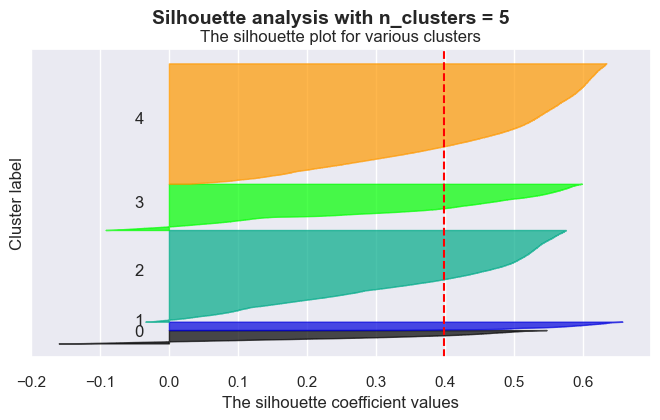

In [23]:
cust_df_norm['K-means_labels_RFM_RS_tsne'] = cluster_labels
cust_df['K-means_labels_RFM_RS_tsne'] = cluster_labels
print(cust_df_norm.groupby('K-means_labels_RFM_RS_tsne').size())

# Compute the silhouette scores for each sample
sample_silh_values = silhouette_samples(cust_df_norm[col_list], cluster_labels)

silhouette_plot(cluster_labels, n_clusters, silh_avg, sample_silh_values)

Most of the customers are captured by clusters # 2, 3 and 4\
while clusters numbers # 0 and 1 represent 7.7% of the customers.\
Next, we will check what those clusters represent in terms of customer characteristics.

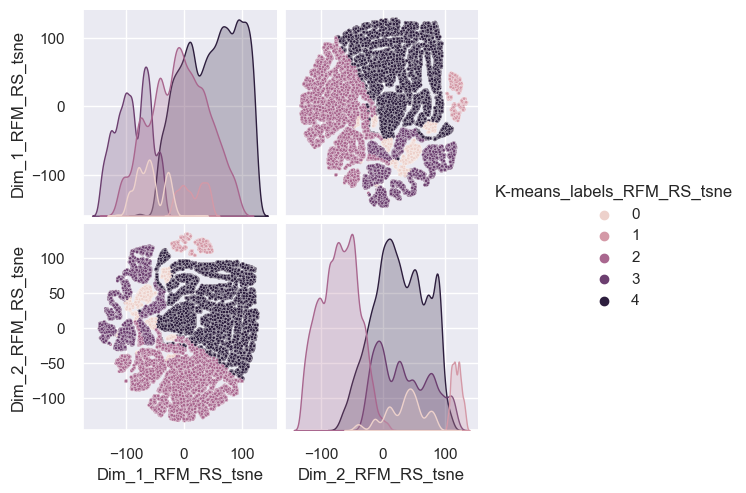

In [24]:
sns.pairplot(cust_df[['Dim_1_RFM_RS_tsne',
                      'Dim_2_RFM_RS_tsne',
                      'K-means_labels_RFM_RS_tsne']],
             hue='K-means_labels_RFM_RS_tsne', plot_kws={'s': 5})

Dimension reduction done on the data using t-SNE method is used here to better visualize the clusters.

Observations:
- Cluster # 0 occupy the region where t-SNE dimension 1 is low and dimension 2 is high\
(customers that gave low review score).
- Cluster # 1 occupy a region where t-SNE dimension 2 is high\
(customers that made multiple orders).
- Cluster # 2 occupy a region where t-SNE dimension 2 is low\
(customers that made purchase long time ago).
- Cluster # 3 occupy the region where t-SNE dimension 1 is low\
(it's hard to identify those customers as this stage).
- Cluster # 4 occupy a region where t-SNE dimension 1 and 2 are high\
(customers that made purchase recently and gave mostly good review score).

Lets now analyse feature per feature to confirm those observations and find what cluster # 3 represents.

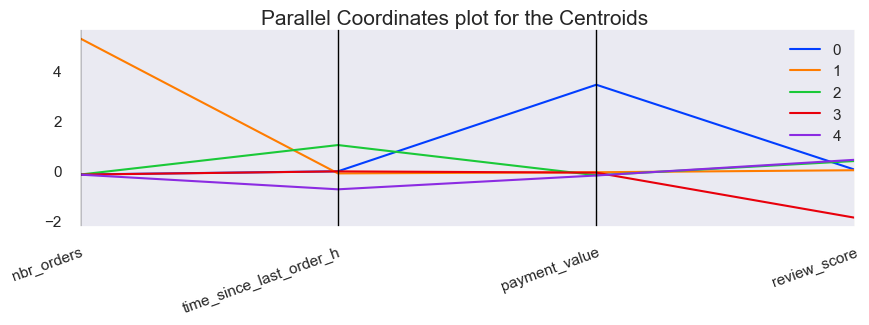

In [25]:
col_list = ['nbr_orders', 'time_since_last_order_h',
            'payment_value', 'review_score']
# Create a data frame containing our centroids
centroids = cust_df_norm.groupby('K-means_labels_RFM_RS_tsne')[col_list].mean()
centroids = pd.DataFrame(centroids,
                         columns=col_list)
centroids['cluster_labels'] = centroids.index

display_parallel_coordinates_centroids(centroids, 5, 'cluster_labels')

Observations:
- Cluster # 0 represents customers who made a high payment value order and gave good review score.
- Cluster # 1 represents customers who made mutiple orders and gave good review score.
- Cluster # 2 represents customers who made an order long time ago and gave high review score.
- Cluster # 3 represents customers who gave low review score.
- Cluster # 4 represents customers who made a purchase recently and gave high review score.

Those classifications reconfirm the t-SNE analysis done before for clusters # 1, 2, 4.

For better visulalisation of the customer characteritics in each cluster, we used radar plots as well.

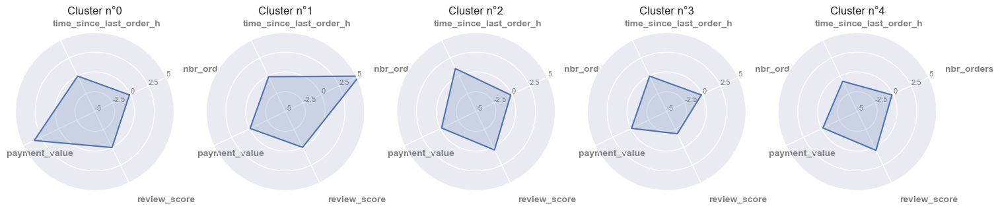

In [26]:
col_list = ['nbr_orders', 'time_since_last_order_h',
            'payment_value', 'review_score']\
           + ['K-means_labels_RFM_RS_tsne']

radar_plot_for_each_cluster(cust_df_norm, col_list, 5)

Radar plots reconfirm the assignement of customers in each cluster.

We can go deeper and analyse the distributions of each feature in each cluster using barplot.

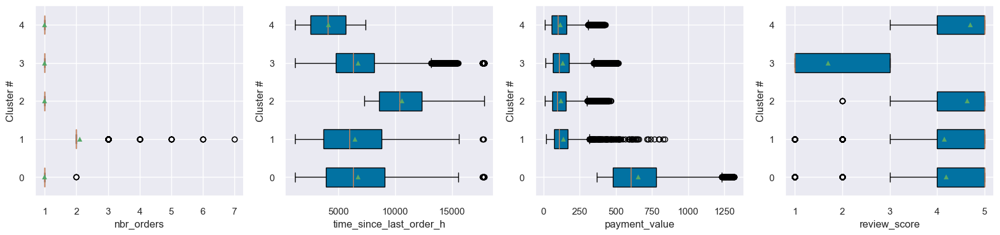

In [27]:
col_list = ['nbr_orders', 'time_since_last_order_h',
            'payment_value', 'review_score']
cat_column = 'K-means_labels_RFM_RS_tsne'

n_col = len(col_list)
fig, axes = plt.subplots(1, n_col, figsize=(20, 4))
axes = np.array(axes)
i = 0
cat_list = cust_df.groupby(by=cat_column).nunique()\
                  .sort_values(cat_column, ascending=True).head(10).index
for ax in axes.reshape(-1):
    groupes = []
    for m in cat_list:
        groupes.append(cust_df[cust_df[cat_column] == m][col_list[i]])
    ax.boxplot(groupes, labels=cat_list, vert=False,
               patch_artist=True, showmeans=True)
    ax.set_xlabel(format(col_list[i]))
    ax.set_ylabel(format('Cluster #'))
    i += 1
plt.show()

Adding to the observations done before:
- Few customers in clusters # 0, 1, and 4 gave low review score.
- Cluster # 1 that represents customers who made multiple orders\
also has few customers that made high payment value purchase.
- Cluster # 0 that represents customers who made high payment value order\
and gave good review score has few customers that made multiple orders.

Now we can check if there any correlation between features cluster by cluster.

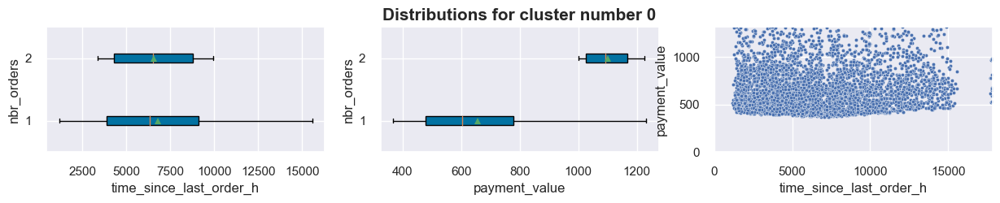

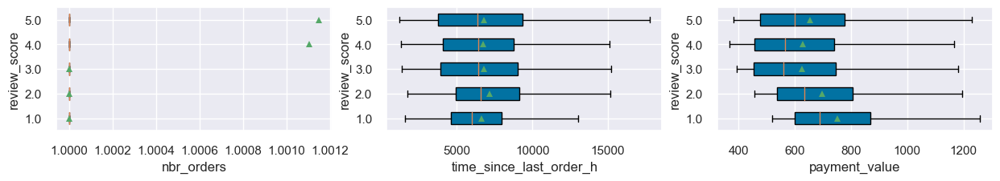

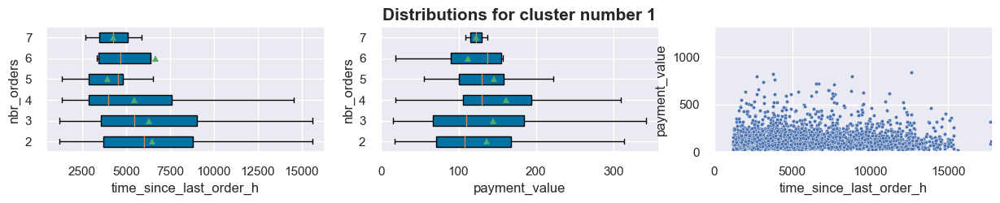

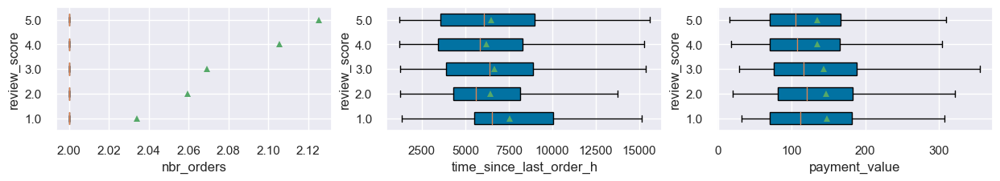

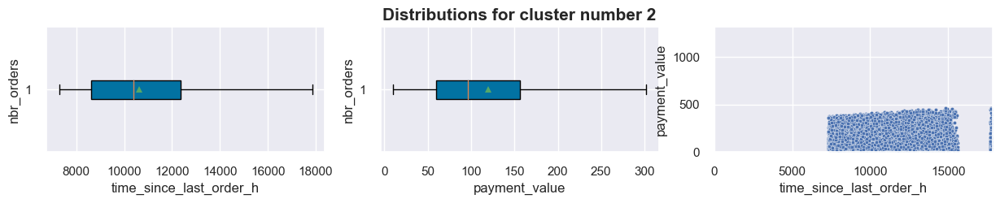

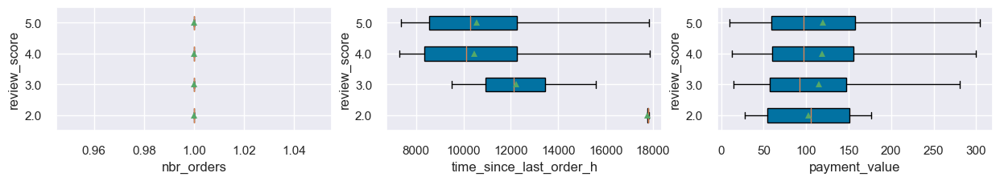

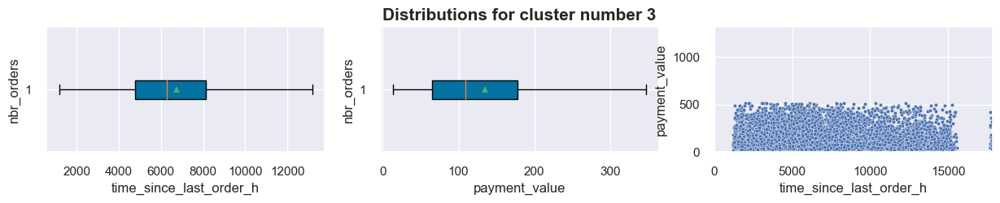

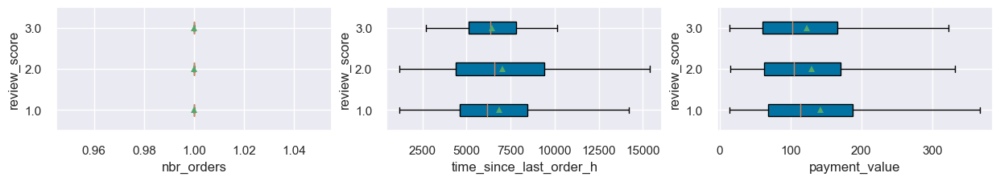

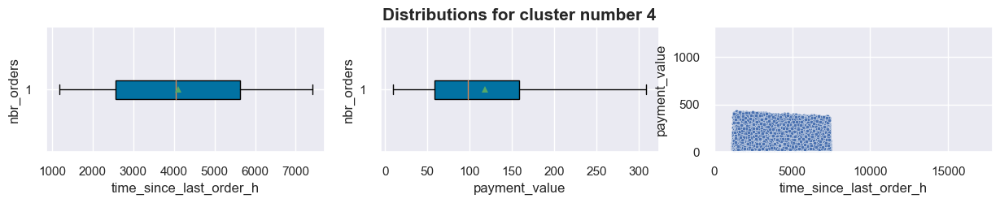

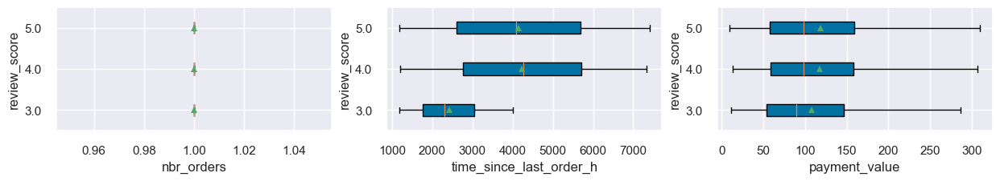

In [28]:
for cluster_num in cust_df['K-means_labels_RFM_RS_tsne'].sort_values().unique():
    X = cust_df[cust_df['K-means_labels_RFM_RS_tsne'] == cluster_num]

    fig, axes = plt.subplots(1, 3, figsize=(15, 2))
    cat_column = 'nbr_orders'
    i = 0
    for column in ['time_since_last_order_h', 'payment_value']:
        cat_list = X.groupby(by=cat_column).nunique()\
                    .sort_values(cat_column, ascending=True).head(10).index
        groupes = []
        for m in cat_list:
            groupes.append(X[X[cat_column] == m][column])
        axes[i].boxplot(groupes, labels=cat_list, showfliers=False,
                        vert=False, patch_artist=True, showmeans=True)
        axes[i].set_xlabel(format(column))
        axes[i].set_ylabel(format(cat_column))
        i += 1

    sns.scatterplot(data=X,
                    x='time_since_last_order_h',
                    y='payment_value',
                    s=10,
                    ax=axes[2])
    axes[2].set_xlim(0, cust_df['time_since_last_order_h'].max())
    axes[2].set_ylim(0, cust_df['payment_value'].max())
    axes[1].set_title('Distributions for cluster number {}'
                      .format(cluster_num), fontsize=15, fontweight='bold')
    plt.show()

    fig, axes = plt.subplots(1, 3, figsize=(15, 2))
    cat_column = 'review_score'
    i = 0
    for column in ['nbr_orders', 'time_since_last_order_h', 'payment_value']:
        cat_list = X.groupby(by=cat_column).nunique()\
                    .sort_values(cat_column, ascending=True).head(10).index
        groupes = []
        for m in cat_list:
            groupes.append(X[X[cat_column] == m][column])
        axes[i].boxplot(groupes, labels=cat_list, showfliers=False,
                        vert=False, patch_artist=True, showmeans=True)
        axes[i].set_xlabel(format(column))
        axes[i].set_ylabel(format(cat_column))
        i += 1
    plt.show()

Not much correlation between the features.

##### <font id='Sec.1.1.2.3'> iii) Final conclusion
    
Final observations:
- Cluster # 0 represents customers who made a high payment value order and gave good review score.\
    They represent 4.7% of the customers base.
- Cluster # 1 represents customers who made mutiple orders and gave good review score.\
    They represent 3% of the customers base.
- Cluster # 2 represents customers who made an order long time ago and gave high review score.\
    They represent 32.8% of the customers base.
- Cluster # 3 represents customers who gave low review score.\
    They represent 16.5% of the customers base.
- Cluster # 4 represents customers who made a purchase recently and gave high review score.\
    They represent 43% of the customers base.

Final analysis:
- Customers in cluster # 0 are happy and made high purchase value order.\
    Since it has been some time since their last order, there is need to target and bring them back.
- Customers in cluster # 1 are loyal, they are happy and made mutilple orders over time.\
    There is no need to target them at this time.
- Customers in cluster # 2 were happy with their purchase but we lost them\
    due to a purchase made long time ago, we can try to bring them back.
- Customers in cluster # 3 weren't happy with their purchase.\
    We can try to find out why using for example the delivery time.
- Customers in cluster # 4 are the new customers and they were very happy with their purchase.\
    There is no need to target them at this time.

Summary:
Clusters # 2 should be the main focus of the marketing strategie followed by cluster # 0\
    to bring these customers back.\
Further analysis can be done in order to find out why cluster # 3 weren't happy with their purchase.\
    We will use next the delivery time to find out if the low review score is due to late delivery.

#### <font id='Sec.1.1.3'> c) RFM + review_score + delivery time features

##### <font id='Sec.1.1.3.1'> i) Finding the number of clusters

In [29]:
col_list = ['nbr_orders', 'time_since_last_order_h',
            'payment_value', 'review_score', 'delivery_time_h']

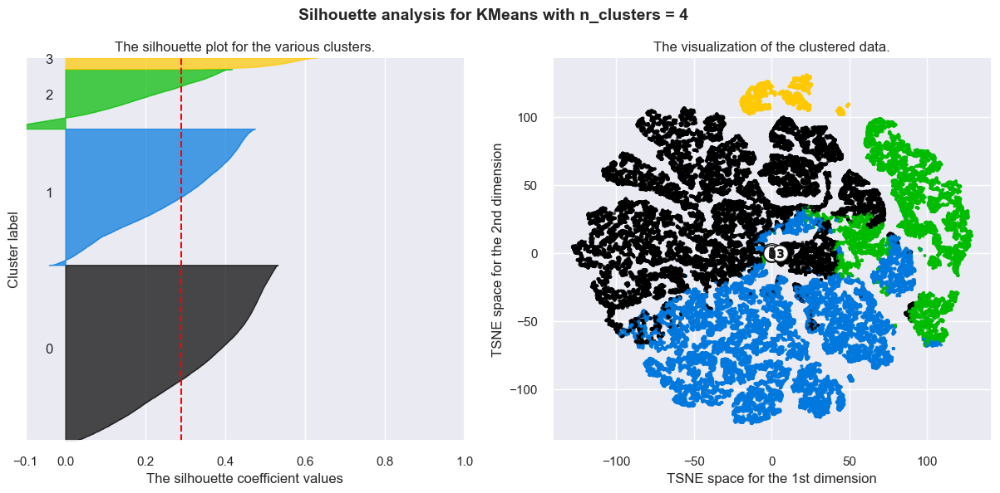

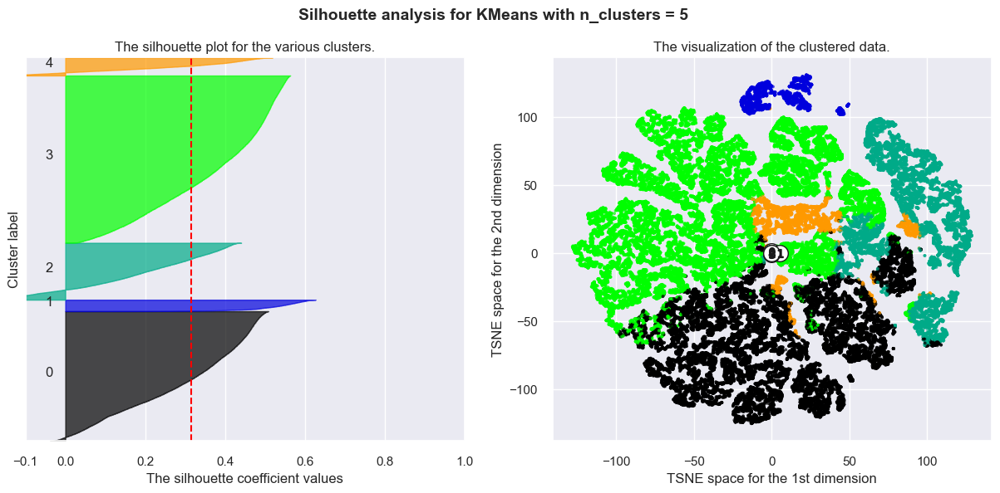

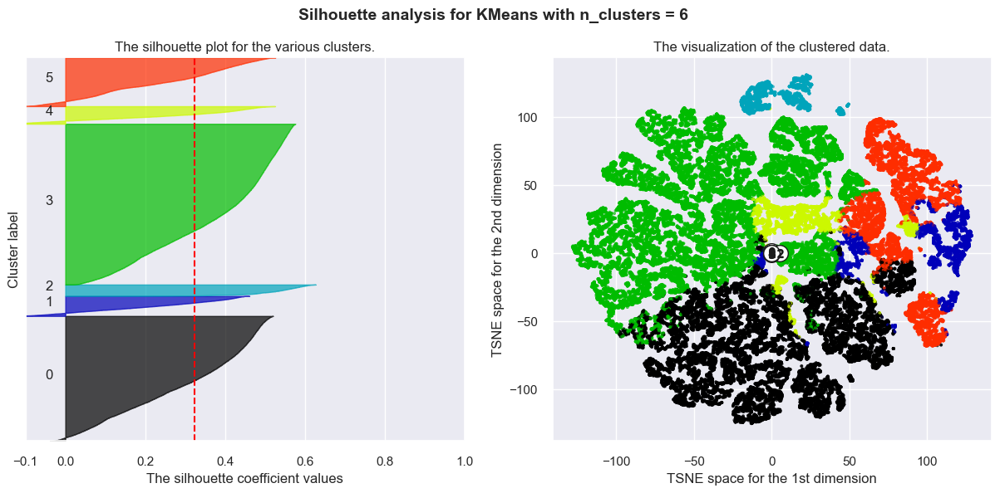

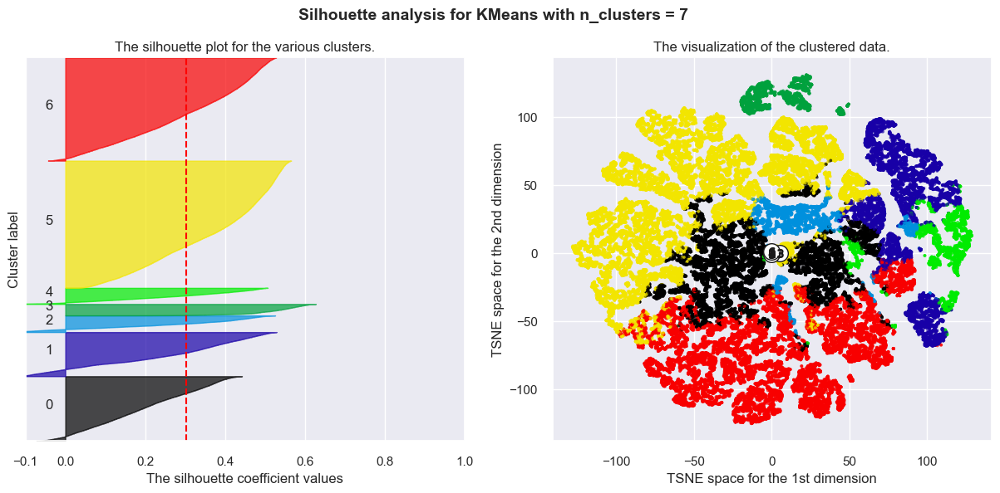

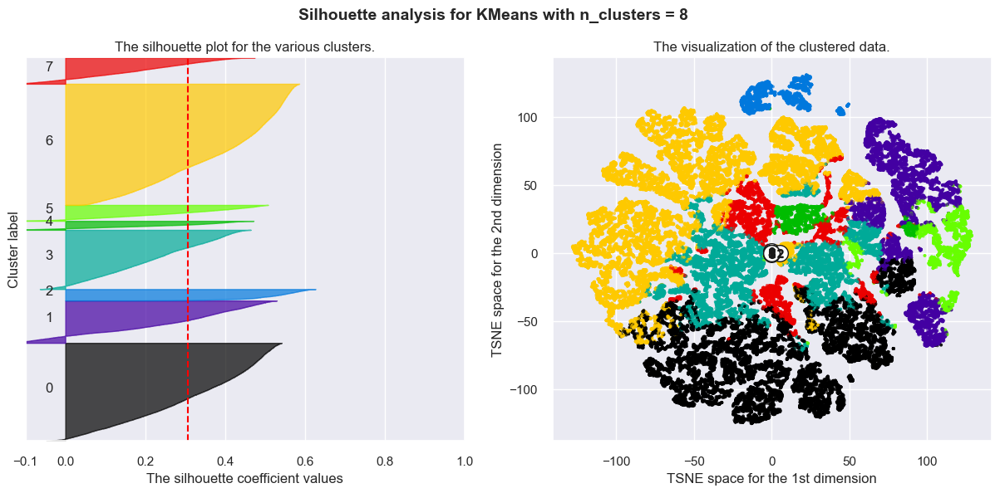

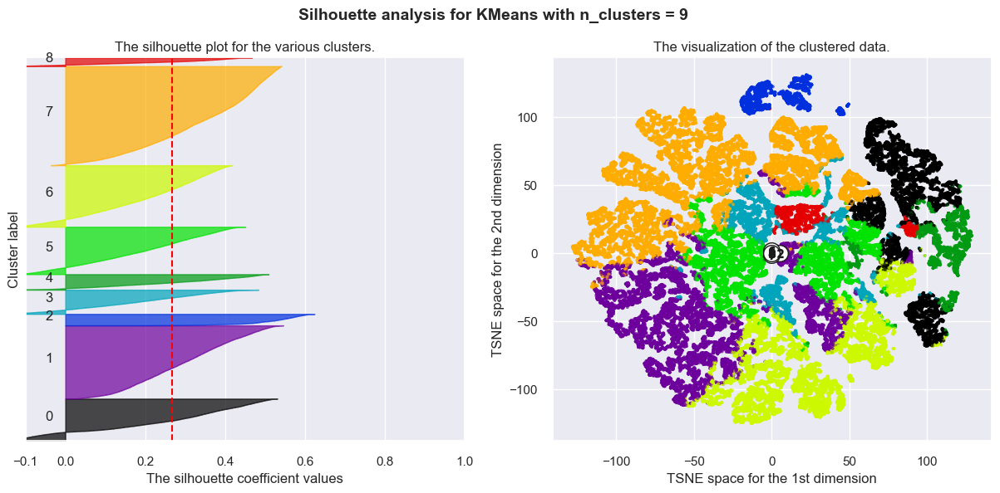

In [30]:
# Number of clusters range to test for k-means
range_n_clusters = np.arange(4, 10, 1)

# Initialisation of a df that will help in the selection of the n_clusters
output = []

# Realize the test
output = n_clusters_test_k_means(cust_df_norm, col_list, range_n_clusters,
                                 'Dim_1_RFM_RS_DT_tsne', 'Dim_2_RFM_RS_DT_tsne')

Observations:
- We see, for all n_clusters, that the silhouette average (red dashed line) is below all clusters
- We see that n_clusters = 6 give the highest silhouette score followed by n_clusters = 5
- For n_clusters = 6, we see that most of customers are captured by clusters # 0, and 3\
while clusters # 1, 2 and 4 are much smaller.

We will check the elbow curve, silhouette and Davies Bouldin score to choose the final n_clusters

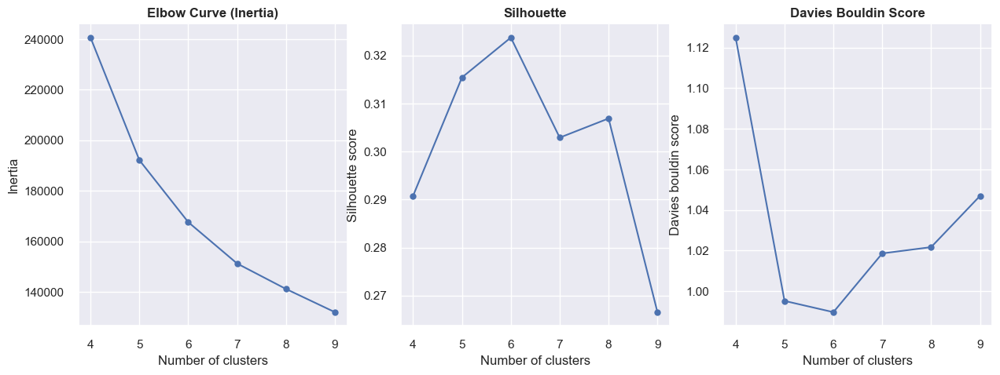

In [31]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].plot(output['n_clusters'], output['inertia'], marker='o')
axes[0].set_title('Elbow Curve (Inertia)', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Inertia')
axes[0].set_xlabel('Number of clusters')
axes[1].plot(output['n_clusters'], output['silhouette_score'], marker='o')
axes[1].set_title('Silhouette', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Silhouette score')
axes[1].set_xlabel('Number of clusters')
axes[2].plot(output['n_clusters'], output['davies_bouldin_score'], marker='o')
axes[2].set_title('Davies Bouldin Score', fontsize=12, fontweight='bold')
axes[2].set_ylabel('Davies bouldin score')
axes[2].set_xlabel('Number of clusters')
plt.show()

6 clusters seems optimal using the elbow curve, silhouette, and Davies-Bouldin score.

##### <font id='Sec.1.1.3.2'> ii) Analysing customers characteristics of each cluster

In [32]:
n_clusters = 6

clusterer = KMeans(n_clusters=n_clusters,
                   init='k-means++',
                   n_init=10).fit(cust_df_norm[col_list])
cluster_labels = clusterer.labels_

# The silhouette_score gives the average value for all the samples.
silh_avg = silhouette_score(cust_df_norm[col_list], cluster_labels)

print('Inertia value: {}, silhouette score: {}, and davies bouldin score: {}.'
      .format(clusterer.inertia_,
              silh_avg,
              davies_bouldin_score(cust_df_norm[col_list], cluster_labels)))

Inertia value: 167600.11115796337, silhouette score: 0.3237666524014265, and davies bouldin score: 0.9907136296255601.


K-means_labels_RFM_RS_DT_tsne
0     4876
1    11702
2    30134
3    38793
4     4237
5     2764
dtype: int64


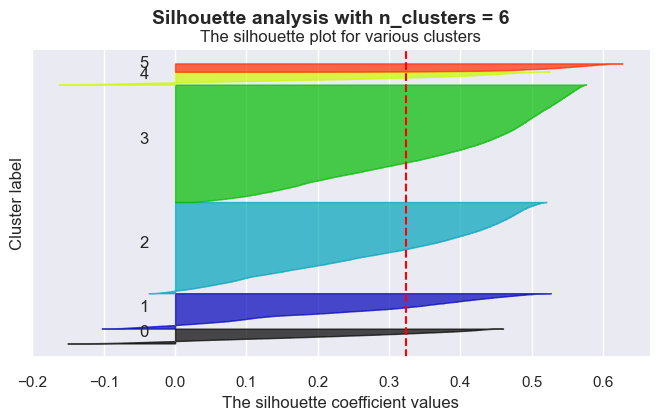

In [33]:
cust_df_norm['K-means_labels_RFM_RS_DT_tsne'] = cluster_labels
cust_df['K-means_labels_RFM_RS_DT_tsne'] = cluster_labels
print(cust_df_norm.groupby('K-means_labels_RFM_RS_DT_tsne').size())

# Compute the silhouette scores for each sample
sample_silh_values = silhouette_samples(cust_df_norm[col_list], cluster_labels)

silhouette_plot(cluster_labels, n_clusters, silh_avg, sample_silh_values)

As observed in the silhouette analysis, most of the customers are captured by two clusters.\
Next, we will check what those clusters represent in terms of customer characteristics.

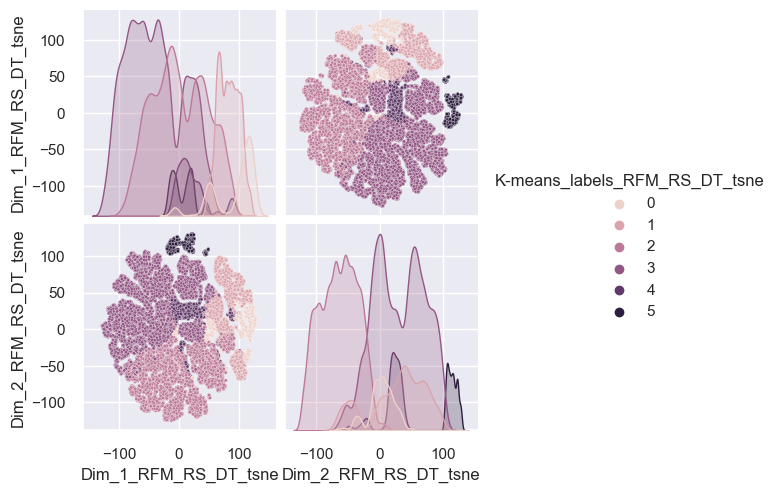

In [34]:
sns.pairplot(cust_df[['Dim_1_RFM_RS_DT_tsne',
                      'Dim_2_RFM_RS_DT_tsne',
                      'K-means_labels_RFM_RS_DT_tsne']],
             hue='K-means_labels_RFM_RS_DT_tsne', plot_kws={'s': 5})

Dimension reduction done on the data using t-SNE method is used here to better visualize the clusters.

Observations:
- Cluster # 0 occupy the region where t-SNE dimension 1 is high\
(customers that had high delivery time).
- Cluster # 1 occupy a region where t-SNE dimension 1 is high\
(customers that gave low review score).
- Cluster # 2 occupy a region where t-SNE dimension 2 is low\
(customers that made an order long time ago).
- Cluster # 3 occupy a region where t-SNE dimension 1 is low and dimension 2 is high\
(customers that gave high review score).
- Cluster # 4 is hard to assign it to a region.
- Cluster # 5 occupy a region where t-SNE dimension 2 is high\
(customers that made multiple orders).

Lets now analyse feature per feature to confirm those observations and find what cluster # 4 represents.

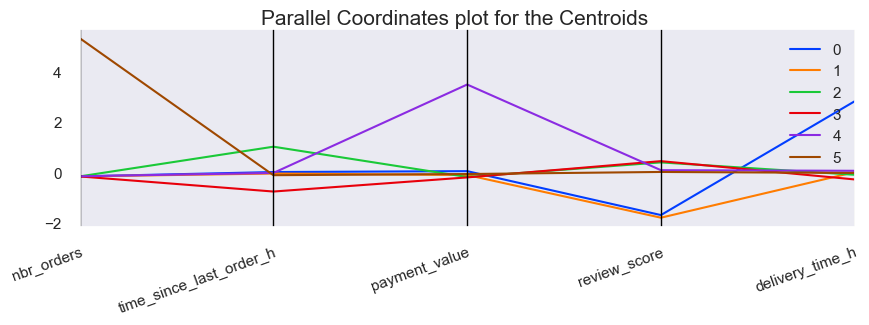

In [35]:
col_list = ['nbr_orders', 'time_since_last_order_h',
            'payment_value', 'review_score',
            'delivery_time_h']
# Create a data frame containing our centroids
centroids = cust_df_norm.groupby('K-means_labels_RFM_RS_DT_tsne')[col_list].mean()
centroids = pd.DataFrame(centroids,
                         columns=col_list)
centroids['cluster_labels'] = centroids.index

display_parallel_coordinates_centroids(centroids, 5, 'cluster_labels')

Observations:
- Cluster # 0 represents customers who gave low review score and had long delivery time of their order.
- Cluster # 1 represents customers who gave low review score.
- Cluster # 2 represents customers who made an order long time ago and gave high review score.
- Cluster # 3 represents customers who made a purchase recently, gave high review score, and had fast shipping.
- Cluster # 4 represents customers who made a high value purchase and gave good review score.
- Cluster # 5 represents customers who made multiple orders and gave good review score.

Those classifications reconfirm the t-SNE analysis done before for clusters # 0, 1, 2, and 5.

For better visulalisation of the customer characteritics in each cluster, we used radar plots as well.

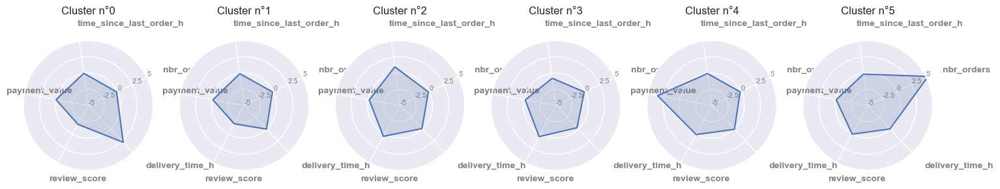

In [36]:
col_list = ['nbr_orders', 'time_since_last_order_h',
            'payment_value', 'review_score', 'delivery_time_h']\
           + ['K-means_labels_RFM_RS_DT_tsne']

radar_plot_for_each_cluster(cust_df_norm, col_list, 6)

Radar plots reconfirm the assignement of customers in each cluster.

We can go deeper and analyse the distributions of each feature in each cluster using barplot.

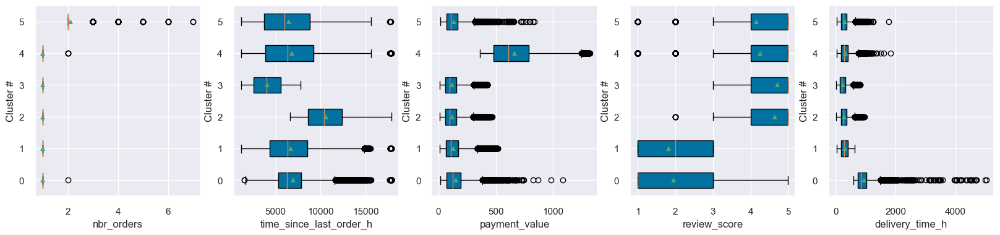

In [37]:
col_list = ['nbr_orders', 'time_since_last_order_h',
            'payment_value', 'review_score', 'delivery_time_h']
cat_column = 'K-means_labels_RFM_RS_DT_tsne'

n_col = len(col_list)
fig, axes = plt.subplots(1, n_col, figsize=(20, 4))
axes = np.array(axes)
i = 0
cat_list = cust_df.groupby(by=cat_column).nunique()\
                  .sort_values(cat_column, ascending=True).head(10).index
for ax in axes.reshape(-1):
    groupes = []
    for m in cat_list:
        groupes.append(cust_df[cust_df[cat_column] == m][col_list[i]])
    ax.boxplot(groupes, labels=cat_list, vert=False,
               patch_artist=True, showmeans=True)
    ax.set_xlabel(format(col_list[i]))
    ax.set_ylabel(format('Cluster #'))
    i += 1
plt.show()

Adding to the observations done before:
- Few customers in clusters # 0 and 4 made multiple orders.
- Few customers in clusters # 0 and 5 made high payment value purchase.
- Few customers in clusters # 4 and 5 gave low review score.
- Few customers in clusters # 4 and 5 had long delivery time.

Now we can check if there any correlation between features cluster by cluster.

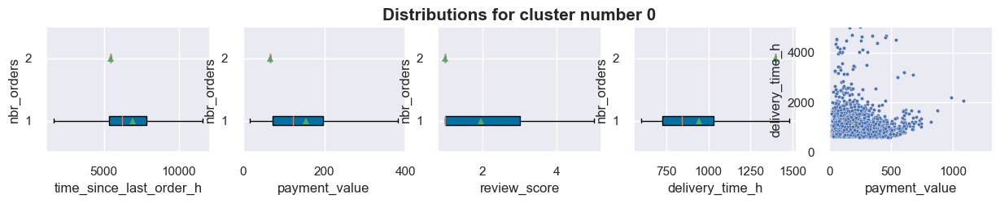

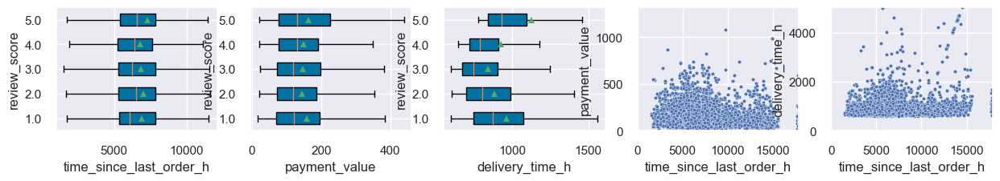

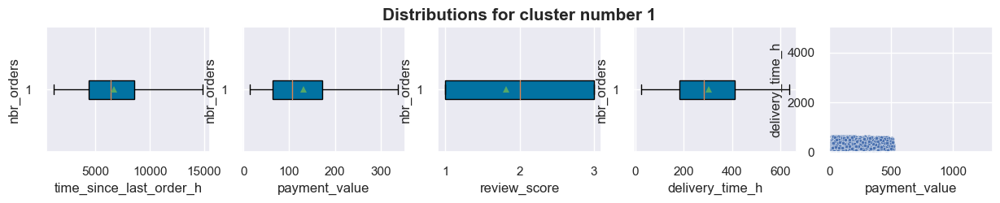

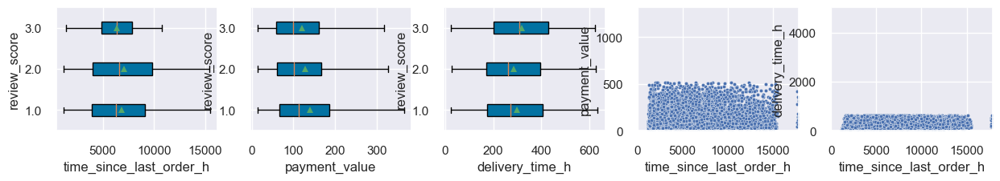

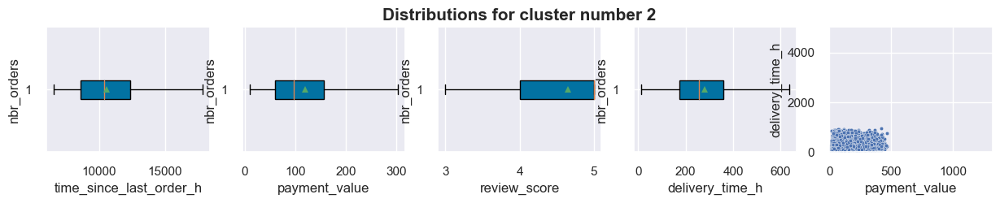

...

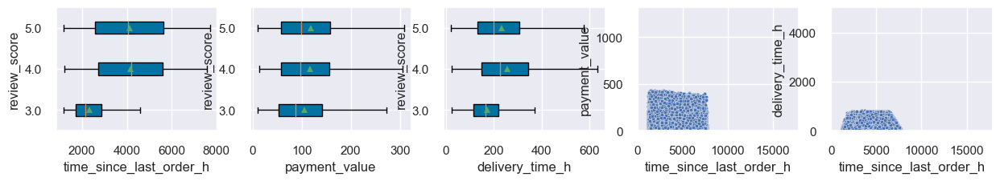

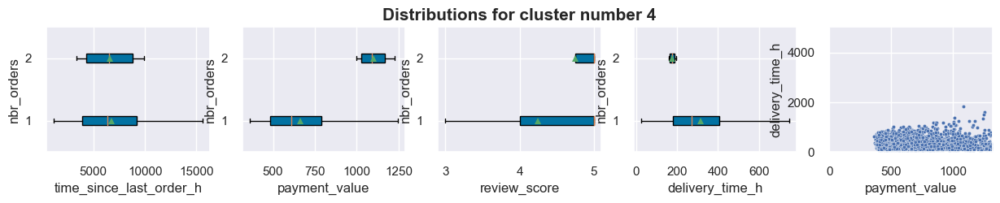

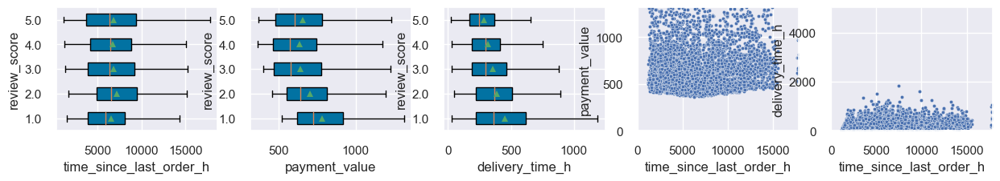

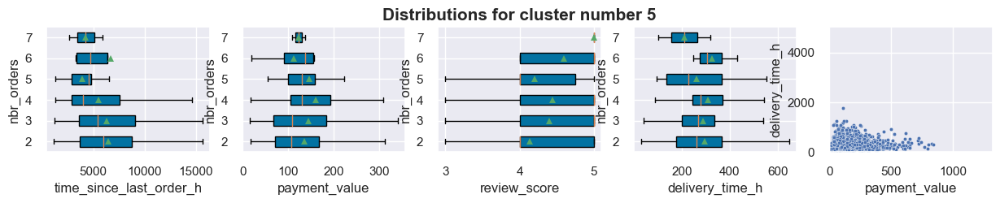

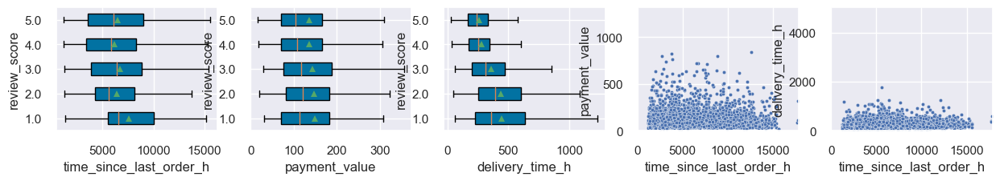

In [38]:
for cluster_num in cust_df['K-means_labels_RFM_RS_DT_tsne'].sort_values().unique():
    X = cust_df[cust_df['K-means_labels_RFM_RS_DT_tsne'] == cluster_num]
    num_columns = ['time_since_last_order_h', 'payment_value',
                   'review_score', 'delivery_time_h']
    cat_column = 'nbr_orders'
    cat_list = X.groupby(by=cat_column).nunique()\
                .sort_values(cat_column, ascending=True).head(10).index

    fig, axes = plt.subplots(1, 5, figsize=(15, 2))
    i = 0
    for column in num_columns:
        groupes = []
        for m in cat_list:
            groupes.append(X[X[cat_column] == m][column])
        axes[i].boxplot(groupes, labels=cat_list, showfliers=False,
                        vert=False, patch_artist=True, showmeans=True)
        axes[i].set_xlabel(format(column))
        axes[i].set_ylabel(format(cat_column))
        i += 1

    sns.scatterplot(data=X,
                    x='payment_value',
                    y='delivery_time_h',
                    s=10,
                    ax=axes[i])
    axes[i].set_xlim(0, cust_df['payment_value'].max())
    axes[i].set_ylim(0, cust_df['delivery_time_h'].max())
    axes[2].set_title('Distributions for cluster number {}'
                      .format(cluster_num), fontsize=15, fontweight='bold')
    plt.show()

    cat_column = 'review_score'
    cat_list = X.groupby(by=cat_column).nunique()\
                .sort_values(cat_column, ascending=True).head(10).index
    fig, axes = plt.subplots(1, 5, figsize=(15, 2))
    i = 0
    for column in ['time_since_last_order_h', 'payment_value', 'delivery_time_h']:
        groupes = []
        for m in cat_list:
            groupes.append(X[X[cat_column] == m][column])
        axes[i].boxplot(groupes, labels=cat_list, showfliers=False,
               vert=False, patch_artist=True, showmeans=True)
        axes[i].set_xlabel(format(column))
        axes[i].set_ylabel(format(cat_column))
        i += 1

    sns.scatterplot(data=X,
                    x='time_since_last_order_h',
                    y='payment_value',
                    s=10,
                    ax=axes[i])
    axes[i].set_xlim(0, cust_df['time_since_last_order_h'].max())
    axes[i].set_ylim(0, cust_df['payment_value'].max())
    i += 1
    sns.scatterplot(data=X,
                    x='time_since_last_order_h',
                    y='delivery_time_h',
                    s=10,
                    ax=axes[i])
    axes[i].set_xlim(0, cust_df['time_since_last_order_h'].max())
    axes[i].set_ylim(0, cust_df['delivery_time_h'].max())
    plt.show()

Not much correlation between the features.

##### <font id='Sec.1.1.3.3'> iii) Final conclusion
  
Final observations:
- Cluster # 0 represents customers who gave low review score and had long delivery time of their order.\
    They represent 5.2% of the customer base.
- Cluster # 1 represents customers who gave low review score.\
    They represent 12.7% of the customer base.
- Cluster # 2 represents customers who made an order long time ago and gave high review score.\
    They represent 32.6% of the customer base.
- Cluster # 3 represents customers who made a purchase recently and gave high review score.\
    They represent 41.9% of the customer base.
- Cluster # 4 represents customers who made a high value purchase and gave good review score.\
    They represent 4.6% of the customers base.
- Cluster # 5 represents customers who made multiple orders and gave good review score.\
    They represent 3% of the customer base.

Final analysis:
- Customers in cluster # 0 weren't happy with their purchase.\
    This is because of the long delivery time of their orders.
- Customers in cluster # 1 weren't happy with their purchase.\
    This is not due to their delivery time but maybe to a fault in the product.
- Customers in cluster # 2 were happy with their purchase but we lost them\
    due to a purchase made long time ago, we can try to bring them back.
- Customers in cluster # 3 are the new customers and they were very happy with their purchase.\
    There is no need to target them at this time.
- Customers in cluster # 4 are happy and made high purchase value order.\
    Since it has been some time since their last order, there is need to target and bring them back.
- Customers in cluster # 5 are loyal, they are happy and made mutilple orders over time.\
    There is no need to target them at this time.


Summary:
The only advantage this test gave us in comparaison to the previous test without the delivery time\
    is that it divided the low review score cluster into two.\
All other clusters have the same charateristic and almost the same size.\
Since the delivery time didn't gave much information other than that 5% of the customers are unhappy\
    because of the long delivery time, we will use the features of RFM with review score\
    but without the delivery time for clustering using the K-means and using the next test models.

### <font id='Sec.1.2'> B. DBScan clustering on RFM + review score features

#### <font id='Sec.1.2.1'> a) Finding the optimal eps and min_samples

In [39]:
col_list = ['nbr_orders', 'time_since_last_order_h',
            'payment_value', 'review_score']
X = cust_df_norm[col_list]

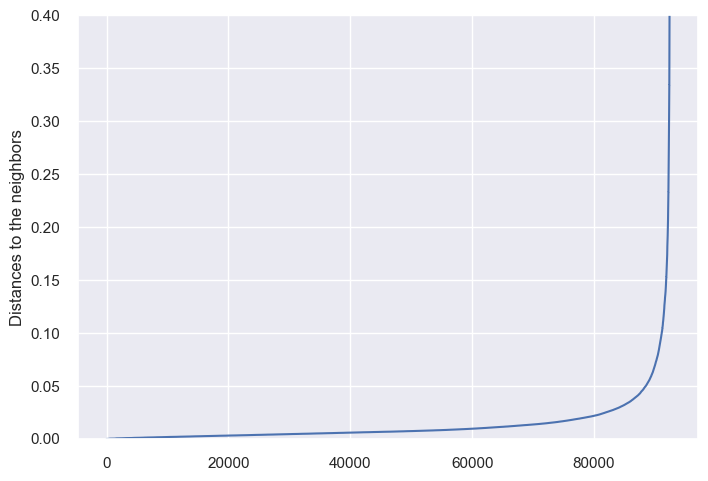

In [40]:
NN = NearestNeighbors(n_jobs=-1).fit(X)
# Find the K-neighbors of a point
distances, indices = NN.kneighbors(X)

distances = np.sort(distances, axis=0)
distances = distances[:, 1]
plt.plot(distances)
plt.ylim(0, 0.4)
plt.ylabel('Distances to the neighbors')
plt.show()

In [41]:
distances[-10:]

array([1.0948887 , 1.1103874 , 1.13351439, 1.25992652, 1.43949792,
       1.5184067 , 1.54788371, 1.5553995 , 1.58576936, 2.68701119])

we can test eps between 0.1 and 0.35 for DBScan and select the one with the best silhouette score.\
We can test as well min_samples of 10 and 100.

In [42]:
min_samples_range = [10, 100]
eps_range = np.arange(0.1, 0.36, 0.05)
output = []

for min_samples in min_samples_range:
    for eps in eps_range:
        clusterer = DBSCAN(min_samples=min_samples, eps=eps, n_jobs=-1).fit(X)
        cluster_labels = clusterer.labels_
        if max(cluster_labels) > 0:
            silhouette = silhouette_score(X, cluster_labels)
            davies_bouldin = davies_bouldin_score(X, cluster_labels)
            output.append((min_samples, eps, silhouette, davies_bouldin))
output = pd.DataFrame(output, columns=['min_samples', 'eps',
                                       'silhouette_score',
                                       'davies_bouldin_score'])
output

,min_samples,eps,silhouette_score,davies_bouldin_score
0,10,0.10,-0.087993,1.400393
1,10,0.15,-0.008327,1.470167
2,10,0.20,0.035194,1.483783
3,10,0.25,0.044368,1.491353
4,10,0.30,0.052828,1.505027
5,10,0.35,0.062561,1.702433
6,100,0.10,-0.178629,1.546991
7,100,0.15,-0.044608,1.854417
8,100,0.20,0.085641,2.020312
9,100,0.25,0.096548,1.827692


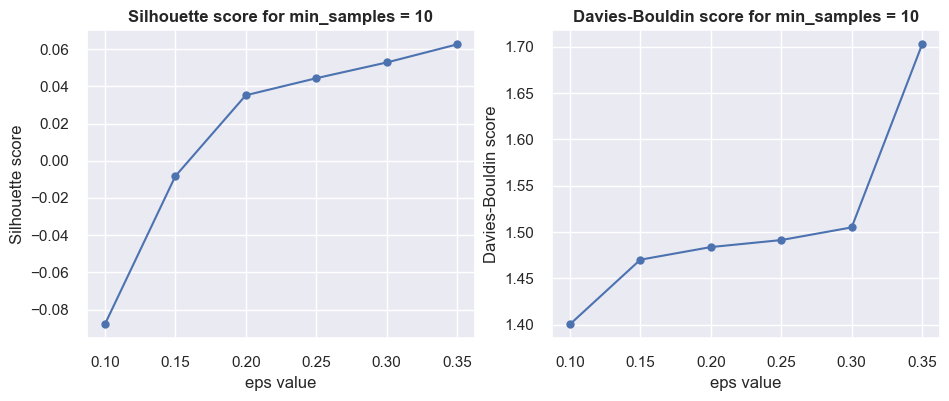

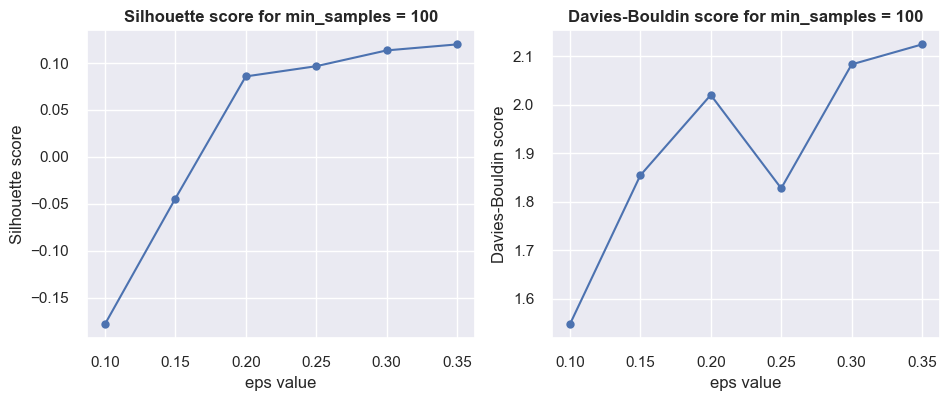

In [43]:
for min_samples in min_samples_range:
    fig, axes = plt.subplots(1, 2, figsize=(11, 4))
    axes[0].plot(output[output['min_samples'] == min_samples]['eps'],
                 output[output['min_samples'] == min_samples]['silhouette_score'],
                 marker='o')
    axes[0].set_title('Silhouette score for min_samples = {}'
                      .format(min_samples), fontsize=12, fontweight='bold')
    axes[0].set_ylabel('Silhouette score')
    axes[0].set_xlabel('eps value')
    axes[1].plot(output[output['min_samples'] == min_samples]['eps'],
                 output[output['min_samples'] == min_samples]['davies_bouldin_score'],
                 marker='o')
    axes[1].set_title('Davies-Bouldin score for min_samples = {}'
                      .format(min_samples), fontsize=12, fontweight='bold')
    axes[1].set_ylabel('Davies-Bouldin score')
    axes[1].set_xlabel('eps value')
    plt.show()

We see that eps of 0.25 for min_samples=100 is the optimal.\
We see also that eps of 0.3 for min_samples=10 is the optimal.\
We will check the number of customers in each clusters and perform silhouette analysis\
in order to choose between the two sets.

In [44]:
clusterer = DBSCAN(eps=0.25, min_samples=100, n_jobs=-1).fit(X)
cluster_labels = pd.DataFrame(clusterer.labels_)
cluster_labels['label'] = cluster_labels
n_clusters = len(cluster_labels['label'].unique())
print(cluster_labels.groupby('label').size())

label
-1     9465
 0    50448
 1    16299
 2     6480
 3     7643
 4     1798
 5      209
 6      164
dtype: int64


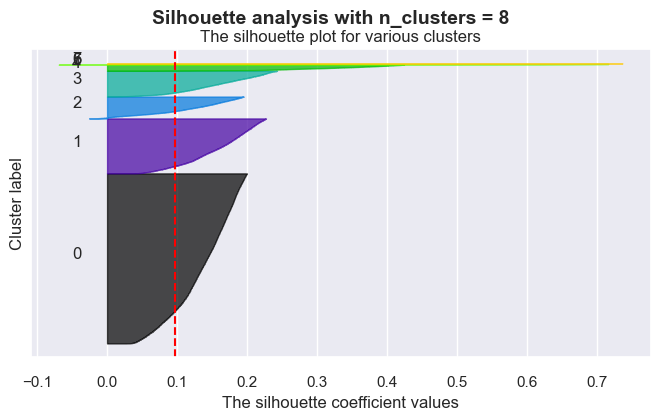

In [45]:
cluster_labels = clusterer.labels_

# The silhouette_score gives the average value for all the samples.
silh_avg = silhouette_score(X, cluster_labels)

# Compute the silhouette scores for each sample
sample_silh_values = silhouette_samples(X, cluster_labels)

silhouette_plot(cluster_labels, n_clusters, silh_avg, sample_silh_values)

In [46]:
clusterer = DBSCAN(eps=0.3, min_samples=10, n_jobs=-1).fit(X)
cluster_labels = pd.DataFrame(clusterer.labels_)
cluster_labels['label'] = cluster_labels
n_clusters = len(cluster_labels['label'].unique())
print(cluster_labels.groupby('label').size())

label
-1      1122
 0     52431
 1     17502
 2      7285
 3      8764
 4      2656
 5        36
 6      1175
 7       716
 8        11
 9        16
 10       10
 11      182
 12       17
 13       45
 14       32
 15       32
 16       95
 17       62
 18      113
 19       46
 20       31
 21       16
 22       16
 23        9
 24       13
 25       11
 26       20
 27       12
 28        8
 29       12
 30       10
dtype: int64


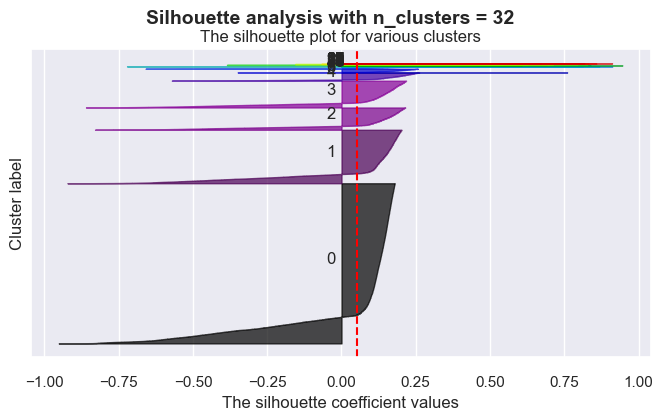

In [47]:
cluster_labels = clusterer.labels_

# The silhouette_score gives the average value for all the samples.
silh_avg = silhouette_score(X, cluster_labels)

# Compute the silhouette scores for each sample
sample_silh_values = silhouette_samples(X, cluster_labels)

silhouette_plot(cluster_labels, n_clusters, silh_avg, sample_silh_values)

min_samples=10 with eps of 0.3 gave lot of small clusters which is not optimal in comparison to\
min_samples=100 with eps of 0.25.\
We will use min_samples=100 with eps of 0.25 for clustering using DBSCAN.

#### <font id='Sec.1.2.2'> b) Analysing customers characteristics of each cluster

In [48]:
clusterer = DBSCAN(eps=0.25, min_samples=100, n_jobs=-1).fit(X)
cluster_labels = clusterer.labels_
print('Silhouette score: {}, and Davies-Bouldin score: {}.'
      .format(silhouette_score(X, cluster_labels),
              davies_bouldin_score(X, cluster_labels)))

Silhouette score: 0.09654833594766396, and Davies-Bouldin score: 1.8276915528642457.


In [49]:
cust_df_norm['DBSCAN_labels_RFM_RS_tsne'] = cluster_labels
cust_df['DBSCAN_labels_RFM_RS_tsne'] = cluster_labels
cust_df_norm.groupby('DBSCAN_labels_RFM_RS_tsne').size()

DBSCAN_labels_RFM_RS_tsne
-1     9465
 0    50448
 1    16299
 2     6480
 3     7643
 4     1798
 5      209
 6      164
dtype: int64

DBSCAN detected outliers in the clusters (9465 customers on cluster -1),\
which represent around 10% of the total customers base.\
We see also cluster # 0 represents more than half of the customer base\
and clusters # 5 and 6 represent very small number of customers.\
We will check next the characteristics of the clusters.

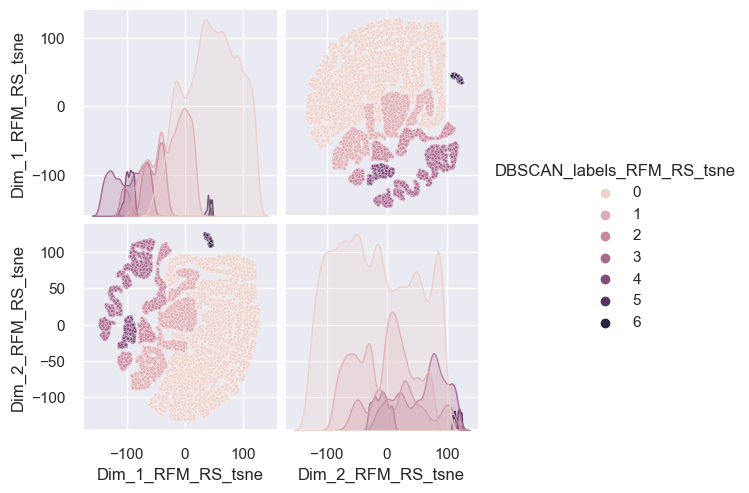

In [50]:
sns.pairplot(cust_df[cust_df['DBSCAN_labels_RFM_RS_tsne'] >= 0]
             [['Dim_1_RFM_RS_tsne',
               'Dim_2_RFM_RS_tsne',
               'DBSCAN_labels_RFM_RS_tsne']],
             hue='DBSCAN_labels_RFM_RS_tsne', plot_kws={'s': 5})
plt.show()

Dimension reduction done on the data using t-SNE method is used here to better visualize the clusters.

First observation is that the customers are highly clustered according to review score.

Observations:
- We excluded cluster # -1 since DBSCAN detected them as outliers, i.e.,\
customers with no common characteritics between them.
- Cluster # 0 occupy a region where t-SNE dimension 1 is high\
(customers that gave high review score 5).
- Cluster # 1 occupy a region where t-SNE dimension 1 is low\
(customers that gave good review score 4).
- Cluster # 2 occupy a region where t-SNE dimension 1 is low\
(customers that gave average review score 3).
- Cluster # 3 occupy a region where t-SNE dimension 1 is very low\
(customers that gave very low review score 1).
- Cluster # 4 occupy a region where t-SNE dimension 1 is low\
(customers that gave low review score 2).
- We cannot identify clusters # 5 and 6.

Lets now analyse feature by feature to confirm those observations\
and find out what are clusters # 5 and 6.

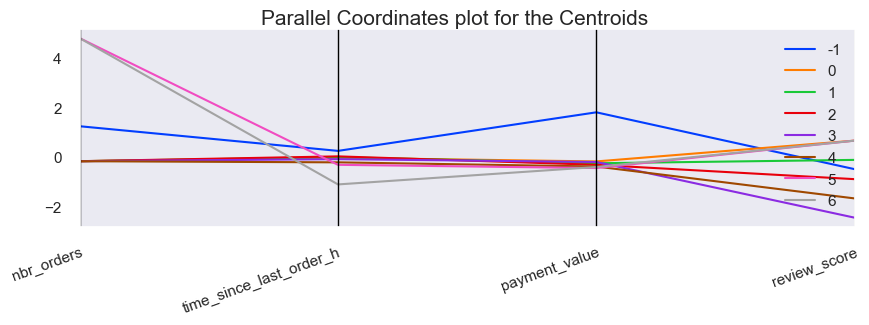

In [51]:
# Create a data frame containing our centroids
centroids = cust_df_norm.groupby('DBSCAN_labels_RFM_RS_tsne')[col_list].mean()
centroids = pd.DataFrame(centroids, columns=col_list)
centroids['cluster_labels'] = centroids.index

display_parallel_coordinates_centroids(centroids, 8, 'cluster_labels')

Observations:
- Cluster # -1 represents outliers. However, customers in this group made multiple orders,\
had made orders long time ago, made high payment value order, and gave average review score.
- Cluster # 0  represents customers who gave high review score.
- Cluster # 1 represents customers who gave good review score.
- Cluster # 2 represents customers who gave average review score.
- Cluster # 3 represents customers who gave very low review score.
- Cluster # 4 represents customers who gave low review score.
- Cluster # 5 represents customers who made multiple orders and gave high review score.
- Cluster # 6 represents customers who made multiple orders, made the order(s) recently,\
and gave high review score.

We can go deeper and analyse the distributions of each feature in each cluster using barplot.

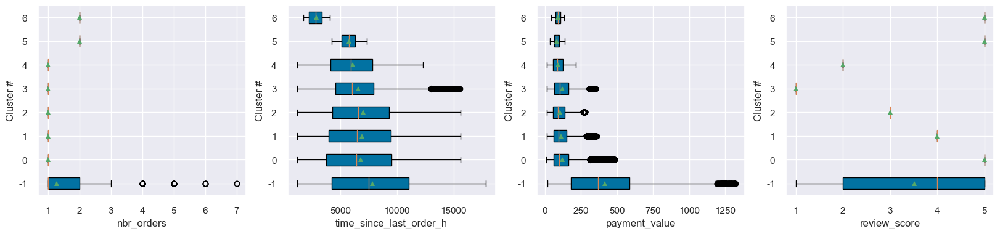

In [52]:
col_list = ['nbr_orders', 'time_since_last_order_h',
            'payment_value', 'review_score']
cat_column = 'DBSCAN_labels_RFM_RS_tsne'

n_col = len(col_list)
fig, axes = plt.subplots(1, n_col, figsize=(20, 4))
axes = np.array(axes)
i = 0
cat_list = cust_df.groupby(by=cat_column).nunique()\
                  .sort_values(cat_column, ascending=True).head(10).index
for ax in axes.reshape(-1):
    groupes = []
    for m in cat_list:
        groupes.append(cust_df[cust_df[cat_column] == m][col_list[i]])
    ax.boxplot(groupes, labels=cat_list, vert=False,
               patch_artist=True, showmeans=True)
    ax.set_xlabel(format(col_list[i]))
    ax.set_ylabel(format('Cluster #'))
    i += 1
plt.show()

Not much can be added to the previous observations.

#### <font id='Sec.1.2.3'> c) Final conclusion
    
DBSCAN clustering divided the customers mostly according to review score which is not optimal.\
    The clustering done by K-means is better so far.

### <font id='Sec.1.3'> C. Agglomerative Hierarchical Clustering on 25000 customers
    using RFM + review score features

#### <font id='Sec.1.3.1'> a) Finding the number of clusters

In [53]:
col_list = ['nbr_orders', 'time_since_last_order_h',
            'payment_value', 'review_score']
col_list_TSNE = ['Dim_1_RFM_RS_tsne', 'Dim_2_RFM_RS_tsne']
X = cust_df_norm[col_list+col_list_TSNE].sample(25000, random_state=42)

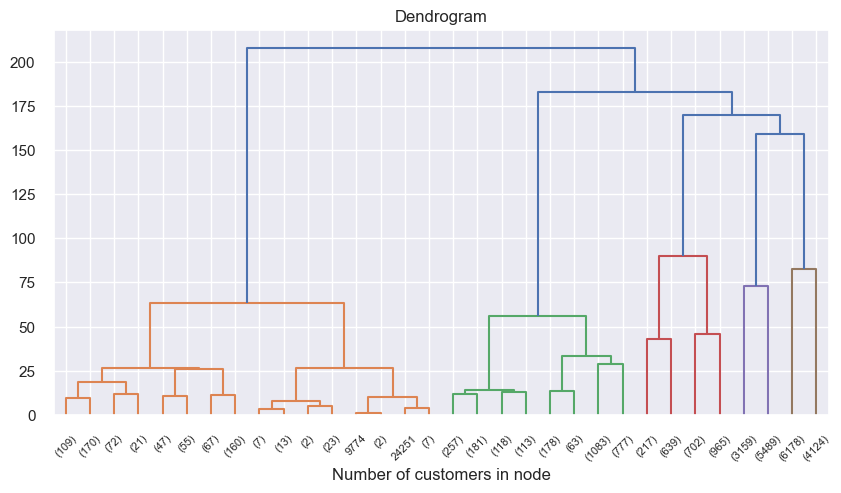

In [54]:
# setting distance_threshold=0 ensures we compute the full tree.
clusterer = AgglomerativeClustering(distance_threshold=0,
                                    n_clusters=None).fit(X[col_list])

# plot the top three levels of the dendrogram
plt.figure(figsize=(10, 5))
plt.title('Dendrogram')
plot_dendrogram(clusterer, truncate_mode='level', p=4)
plt.xlabel('Number of customers in node')
plt.show()

Number of clusters of 5 is optimal using the dendogram.

#### <font id='Sec.1.3.2'> b) Analysing customers characteristics of each cluster

In [55]:
# Create a hierarchical clustering model
clusterer = AgglomerativeClustering(metric='euclidean',
                                    linkage='ward',
                                    compute_full_tree=True)

# Read off 5 clusters:
clusterer.set_params(n_clusters=5)
cluster_labels = clusterer.fit_predict(X[col_list])

print('Silhouette score: {}, and Davies-Bouldin score: {}.'
      .format(silhouette_score(X[col_list], cluster_labels),
              davies_bouldin_score(X[col_list], cluster_labels)))

Silhouette score: 0.3489777919052975, and Davies-Bouldin score: 0.8957280653635561.


In [56]:
# Add cluster number to the original data
X_clustered = pd.DataFrame(X, columns=X.columns, index=X.index)
X_clustered['cluster_labels'] = cluster_labels
n_clusters = len(X_clustered['cluster_labels'].unique())
# Find the size of the clusters
X_clustered['cluster_labels'].value_counts()

1    10302
4     8648
2     2770
0     2523
3      757
Name: cluster_labels, dtype: int64

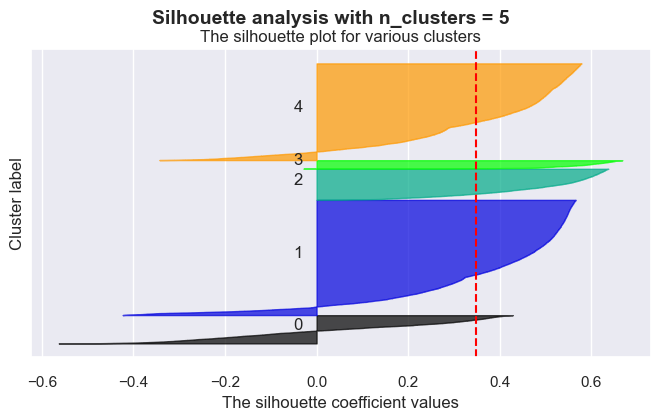

In [57]:
# The silhouette_score gives the average value for all the samples.
silh_avg = silhouette_score(X_clustered[col_list], cluster_labels)

# Compute the silhouette scores for each sample
sample_silh_values = silhouette_samples(X_clustered[col_list], cluster_labels)

silhouette_plot(cluster_labels, n_clusters, silh_avg, sample_silh_values)

We see that clusters # 1 and 4 capture lot of customers\
and clusters # 0 and 3 capture small number of customers.

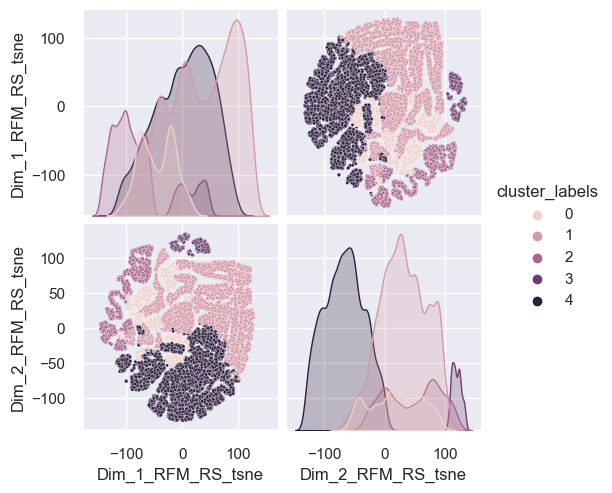

In [58]:
sns.pairplot(X_clustered[['Dim_1_RFM_RS_tsne',
                          'Dim_2_RFM_RS_tsne',
                          'cluster_labels']],
             hue='cluster_labels', plot_kws={'s': 5})
plt.show()

Dimension reduction done on the data using t-SNE method is used here to better visualize the clusters.

Observations:
- Cluster # 0 is hard to assign a region to it.
- Cluster # 1 occupy a region where t-SNE dimension 1 and 2 are high\
(customers that gave high review score).
- Cluster # 2 occupy a region where t-SNE dimension 1 is low and dimension 2 is high\
(customers that gave low review score).
- Cluster # 3 occupy a region where t-SNE dimension 2 is very high\
(customers that made multiple orders).
- Cluster # 4 occupy a region where t-SNE dimension 2 is low\
(customers that gave high review score and made purchase long time ago).

Lets now analyse feature per feature to confirm those observations and find out what the clusters # 0.

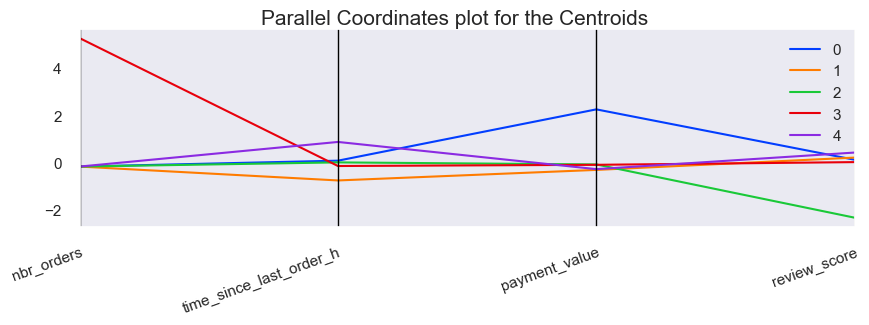

In [59]:
# Create a data frame containing our centroids
centroids = X_clustered.groupby('cluster_labels')[col_list].mean()
centroids = pd.DataFrame(centroids, columns=col_list)
centroids['cluster_labels'] = centroids.index

display_parallel_coordinates_centroids(centroids, 5, 'cluster_labels')

Observations:
- Cluster # 0 represents customers who made high payment value order and gave good review score.
- Cluster # 1 represents customers who made an order recently and gave good review score.
- Cluster # 2 represents customers who gave very low review score.
- Cluster # 3 represents customers who made multiple orders and gave good review score.
- Cluster # 4 represents customers who made a purchase long time ago and gave high review score.

We can go deeper and analyse the distributions of each feature in each cluster using barplot.

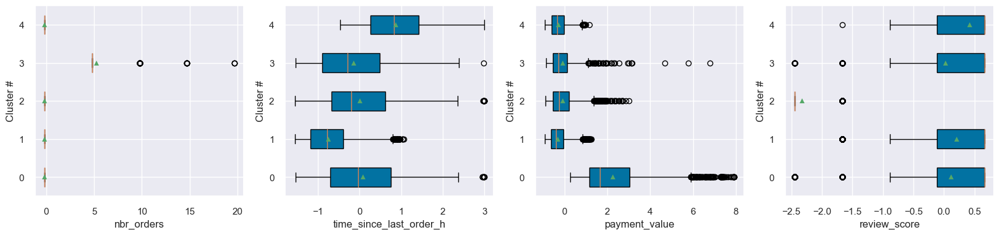

In [60]:
col_list = ['nbr_orders', 'time_since_last_order_h',
            'payment_value', 'review_score']
cat_column = 'cluster_labels'

n_col = len(col_list)
fig, axes = plt.subplots(1, n_col, figsize=(20, 4))
axes = np.array(axes)
i = 0
cat_list = X_clustered.groupby(by=cat_column).nunique()\
                      .sort_values(cat_column, ascending=True).head(10).index
for ax in axes.reshape(-1):
    groupes = []
    for m in cat_list:
        groupes.append(X_clustered[X_clustered[cat_column] == m]
                       [col_list[i]])
    ax.boxplot(groupes, labels=cat_list, vert=False,
               patch_artist=True, showmeans=True)
    ax.set_xlabel(format(col_list[i]))
    ax.set_ylabel(format('Cluster #'))
    i += 1
plt.show()

- Few customers in clusters # 2 and 3 made high payment value order.
- Few customers in clisters # 0 and 3 gave low review score.

#### <font id='Sec.1.3.3'> c) Final conclusion

Final observations:
- Cluster # 0 represents customers who made high payment value order and gave good review score.\
    They represent 10.1% of the 25000 customers.
- Cluster # 1 represents customers who made an order recently and gave good review score.\
    They represent 41.2% of the 25000 customers.
- Cluster # 2 represents customers who gave very low review score.\
    They represent 11.1% of the 25000 customers.
- Cluster # 3 represents customers who made multiple orders and gave good review score.\
    They represent 3% of the 25000 customers.
- Cluster # 4 represents customers who made a purchase long time ago and gave high review score.\
    They represent 34.6% of the 25000 customers.

Final analysis:
- Customers in cluster # 0 are happy and made high purchase value order.\
    Since it has been some time they didn't made an order,\
    there is need to target them in order to not loose them.
- Customers in cluster # 1 are the new customers and they were very happy with their purchase.\
    There is no need to target them at this time.
- Customers in cluster # 2 weren't happy with their purchase.\
    Those are mostly customers who will not come back.
- Customers in cluster # 3 are loyal, they are happy and made mutilple orders over time.\
    There is no need to target them at this time.
- Customers in cluster # 4 were happy with their purchase but we lost them\
    due to a purchase made long time ago, we can try to bring them back.

Summary:
The clusters given by Agglomerative clustering is similar to K-means in terms of\
    number of clusters, customers charateristics of the clusters and the ratio of customers in those clusters.\
However Agglomerative Clustering is heavier on memory than K-means.\
Given all that, K-means using RFM and review score features is best to cluster the customers database.\
We will proceed to the next step for the maintenance contract, i.e.,\
    find out every how many time a new clustering need to be made.

## <font id='Sec.2'> 2. Extracting the dataset with the cluster labels of each customer

In [61]:
cust_df

,nbr_orders,time_since_last_order_h,review_score,delivery_time_h,customer_unique_id,payment_value,Dim_1_RFM_tsne,Dim_2_RFM_tsne,Dim_1_RFM_RS_tsne,Dim_2_RFM_RS_tsne,Dim_1_RFM_RS_DT_tsne,Dim_2_RFM_RS_DT_tsne,K-means_labels_RFM_tsne,K-means_labels_RFM_RS_tsne,K-means_labels_RFM_RS_DT_tsne,DBSCAN_labels_RFM_RS_tsne
0,1,3846.0,5.0,153.0,0000366f3b9a7992bf8c76cfdf3221e2,141.90,38.302284,47.814457,53.231316,28.470566,-83.783745,29.099510,1,4,3,0
1,1,3918.0,4.0,78.0,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,94.735985,-37.067240,15.645178,30.573647,0.099724,69.799250,1,4,3,1
2,1,14060.0,3.0,617.0,0000f46a3911fa3c0805444483337064,86.22,-122.556430,-19.140877,-107.702880,-55.528736,75.253540,-29.539938,0,2,2,2
3,1,8877.0,4.0,480.0,0000f6ccb0745a6a4b88665a16c9f078,43.62,-24.516495,-97.956090,-35.535020,-57.575523,39.546257,-31.594627,0,2,2,1
4,1,8085.0,5.0,315.0,0004aac84e0df4da2b147fca70cf8255,196.89,-40.615044,25.281872,19.037970,-35.633230,-49.541283,-29.783380,0,2,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92501,1,7050.0,5.0,453.0,fffbf87b7a1a6fa8b03f081c5f51a201,167.32,-18.208418,17.293032,35.670310,-23.158468,-23.798714,-29.246960,1,4,2,0
92502,1,7461.0,4.0,722.0,fffea47cd6d3cc0a88bd621562a9d061,84.58,-3.114775,-47.807228,-21.424570,-24.206223,45.236504,-16.252249,0,2,0,1
92503,1,14809.0,5.0,356.0,ffff371b4d645b6ecea244b27531430a,112.46,-129.898540,-1.288444,-41.223576,-88.442980,27.727789,-87.303314,0,2,2,0
92504,1,4034.0,5.0,284.0,ffff5962728ec6157033ef9805bacc48,133.69,38.767967,39.517906,55.326275,25.325758,-66.958830,12.636205,1,4,3,0


In [62]:
cust_df = cust_df.reset_index(drop=True)
cust_df.to_csv('cust_uniq_df_tsne_clusters.csv',
               sep='\t', index=False)
cust_df_norm = cust_df_norm.reset_index(drop=True)
cust_df_norm.to_csv('cust_uniq_df_norm_tsne_clusters.csv',
                    sep='\t', index=False)

# Dataframe that will be send to Olist containing the customers unique id
# and the clusters labels obtained using K-Means (k=5)
# on RFM and review score features
olist_final_df = cust_df[['customer_unique_id',
                          'K-means_labels_RFM_RS_tsne']]
olist_final_df = olist_final_df.rename(columns={'K-means_labels_RFM_RS_tsne'
                                                :'cluster_labels'})
olist_final_df.to_csv('customers_clusters_df.csv',
                      sep='\t', index=False)